In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import seaborn as sns

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold


#from sklearn.metrics import score
from sklearn.metrics import accuracy_score
from sklearn.metrics import make_scorer, f1_score, roc_auc_score, accuracy_score, confusion_matrix, precision_score
import warnings 
warnings.filterwarnings("ignore")

In [2]:
titanic_train = pd.read_csv('train.csv')
titanic_test = pd.read_csv('test.csv')
test_survived = pd.read_csv("gender_submission.csv")

In [3]:
titanic_train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [4]:
titanic_test.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


In [5]:
titanic_train["train/test"] = "Train"
titanic_train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,train/test
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S,Train
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C,Train
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,Train
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S,Train
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S,Train


In [6]:
titanic_test = titanic_test.merge(test_survived)
titanic_test.insert(1,"survived",value=titanic_test["Survived"])
titanic_test.drop(columns="Survived",inplace=True)
titanic_test.rename(columns={"survived":"Survived"}, inplace=True)

#  I will add a new column which called train/test in order not to confuse the train and test datasets. I will split them later.
titanic_test["train/test"] = "Test"
titanic_test.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,train/test
0,892,0,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q,Test
1,893,1,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S,Test
2,894,0,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q,Test
3,895,0,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S,Test
4,896,1,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S,Test


In [7]:
df = pd.concat([titanic_train,titanic_test])
print("Shape of df :",df.shape)
df.head()

Shape of df : (1309, 13)


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,train/test
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S,Train
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C,Train
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,Train
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S,Train
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S,Train


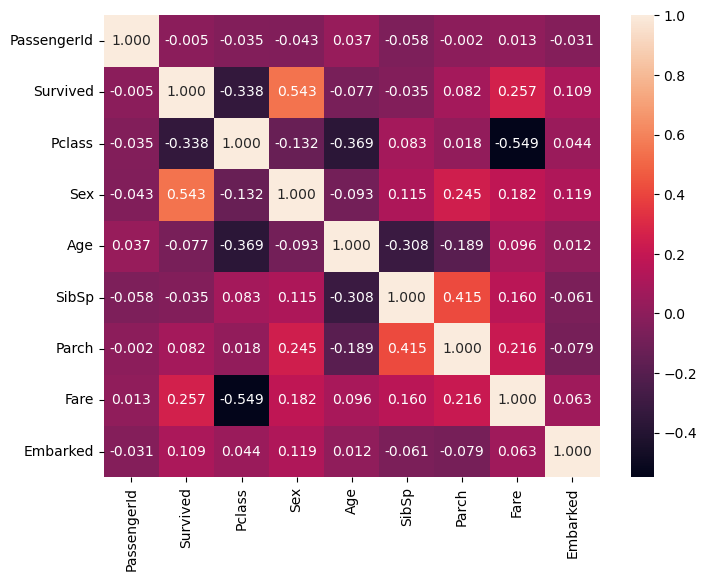

In [8]:
# Assuming titanic_train is your DataFrame
columns_to_exclude = ["Name",'Ticket','Cabin','train/test']
titanic_train['Sex'] = titanic_train['Sex'].map({'male': 0, 'female': 1})
titanic_train['Embarked'] = titanic_train['Embarked'].map({'S': 0, 'C': 1, 'Q':2})

# Exclude the specified columns
columns_to_display = [col for col in titanic_train.columns if col not in columns_to_exclude]

# Create a subset DataFrame without the excluded columns
subset_df = titanic_train[columns_to_display]

# Create the heatmap with the subset DataFrame
plt.figure(figsize=(8, 6))
sns.heatmap(subset_df.corr(), annot=True, fmt=".3f")

# Display the plot
plt.show()


In [9]:
df['Sex'] = df['Sex'].map({'male': 0, 'female': 1})
#df['Embarked'] = df['Embarked'].map({'S': 0, 'C': 1, 'Q':2})

In [10]:
df.drop(columns=["Name","SibSp","Ticket","Age","Fare","Cabin"],inplace=True)
df.dropna(subset=["Embarked"], inplace=True)

In [11]:
categorical_features = ["Pclass","Sex","Parch","Embarked"]
df = pd.get_dummies(df, columns = categorical_features, drop_first = True)

In [12]:
df_train = df[df["train/test"] == "Train"]
df_test = df[df["train/test"] == "Test"]

### Train test Split of the Train Set

In [13]:
x_train = df_train.drop(columns=["Survived","train/test"])
y_train = df_train["Survived"]

x_test = df_test.drop(columns=["Survived","train/test"])
y_test = df_test["Survived"]


In [14]:
y_test

0      0
1      1
2      0
3      0
4      1
      ..
413    0
414    1
415    0
416    0
417    0
Name: Survived, Length: 418, dtype: int64

In [15]:
x_test

,PassengerId,Pclass_2,Pclass_3,Sex_1,Parch_1,Parch_2,Parch_3,Parch_4,Parch_5,Parch_6,Parch_9,Embarked_Q,Embarked_S
0,892,False,True,False,False,False,False,False,False,False,False,True,False
1,893,False,True,True,False,False,False,False,False,False,False,False,True
2,894,True,False,False,False,False,False,False,False,False,False,True,False
3,895,False,True,False,False,False,False,False,False,False,False,False,True
4,896,False,True,True,True,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,1305,False,True,False,False,False,False,False,False,False,False,False,True
414,1306,False,False,True,False,False,False,False,False,False,False,False,False
415,1307,False,True,False,False,False,False,False,False,False,False,False,True
416,1308,False,True,False,False,False,False,False,False,False,False,False,True


In [16]:
x = df.drop(columns=["Survived","train/test"])
y = df["Survived"]

In [17]:
#titanic_train['Sex'] = titanic_train['Sex'].map({'male': 0, 'female': 1})
#titanic_train['Embarked'] = titanic_train['Embarked'].map({'S': 0, 'C': 1, 'Q':2})

In [18]:
#Dropping the columns which has low correlation to survived
#titanic_train = titanic_train.drop(["Name","SibSp","Ticket","Age","Fare","Cabin"], axis=1)

#titanic_train['Pclass'] = titanic_train['Pclass'].astype('category')
#titanic_train['Sex'] = titanic_train['Sex'].astype('category')
#titanic_train['Parch'] = titanic_train['Parch'].astype('category')
#titanic_train['Embarked'] = titanic_train['Embarked'].astype('category')


# One-hot encode 
#categorical_features = ["Pclass","Sex","Parch","Embarked"]
#titanic_train = pd.get_dummies(titanic_train, columns = categorical_features, drop_first = True)
#titanic_train = titanic_train.astype(int)
#titanic_train

In [19]:
# One-hot encode the 'Sex' column
#titanic_test['Sex'] = titanic_test['Sex'].map({'male': 0, 'female': 1})
#titanic_test['Embarked'] = titanic_test['Embarked'].map({'S': 0, 'C': 1, 'Q':2})

#titanic_test = titanic_test.drop(["Name","SibSp","Ticket","Age","Fare","Cabin"], axis=1)
#categorical_features = ["Pclass","Sex","Parch","Embarked"]
#titanic_test = pd.get_dummies(titanic_test, columns = categorical_features, drop_first = True)
#titanic_test = titanic_test.astype(int)
#titanic_test

In [20]:
#titanic_train.head()

In [21]:
#titanic_test.head()

***

In [22]:
column_order = [col for col in titanic_train.columns if col != 'Survived'] + ['Survived']
titanic_train = titanic_train[column_order]

titanic_train.columns

Index(['PassengerId', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp', 'Parch',
       'Ticket', 'Fare', 'Cabin', 'Embarked', 'train/test', 'Survived'],
      dtype='object')

In [23]:
#y = titanic_train['Survived']
#X = titanic_train[['PassengerId', 'Pclass_2', 'Pclass_3', 'Sex_1', 'Parch_1', 'Parch_2',
#       'Parch_3', 'Parch_4', 'Parch_5', 'Parch_6', 'Embarked_1.0',
#       'Embarked_2.0'
#                  ]]

In [24]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [25]:
#titanic_train['Sex_1'].value_counts()


In [26]:
# Create a regular Random Forest model
class_weights = {0: 1, 1: 577 / 314} 

rf_model = RandomForestClassifier(n_estimators=100, random_state=42,class_weight=class_weights)

# Fit the model on the training data
rf_model.fit(x, y)

# Make predictions on the test set
rf_predictions = rf_model.predict(x_test)

# Evaluate the accuracy of the regular Random Forest model
rf_accuracy = accuracy_score(y_test, rf_predictions)

print("Regular Random Forest Accuracy:", rf_accuracy)


Regular Random Forest Accuracy: 1.0


In [27]:
#titanic_test = titanic_test[['PassengerId', 'Pclass_2', 'Pclass_3', 'Sex_1', 'Parch_1', 'Parch_2',
#       'Parch_3', 'Parch_4', 'Parch_5', 'Parch_6', 'Embarked_1.0',
#       'Embarked_2.0'
#                  ]]

rf_predictions = rf_model.predict(x_test)
# Round the predictions to obtain either 0 or 1
rf_predictions_rounded = rf_predictions.round().astype(int)

# Assign the predictions to the 'Survived' column in the test DataFrame
titanic_test['Survived'] = rf_predictions_rounded

# Display the modified test DataFrame with predictions
submission = titanic_test[['PassengerId','Survived']]
submission.to_csv('submission_rf_LZarse_17112023.csv', index=False)

In [29]:
# Define the parameter grid for hyperparameter tuning
param_grid_rf = {
    'n_estimators': [50, 100, 150, 200, 250],
    'max_depth': [None, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2', None],
    'class_weight': [ None, 'balanced', {0: 1, 1: 577 / 314}],  # Adjusted class weights #None, 'balanced',
    'random_state': [42],
    'bootstrap': [True, False]
}

# Define the scoring metrics (F1 score, AUC score, and accuracy)
scoring = {
    'F1 Score': make_scorer(f1_score),
    'AUC': make_scorer(roc_auc_score),
    'Accuracy': make_scorer(accuracy_score),
    'Precision': make_scorer(precision_score)
}

GS = GridSearchCV(estimator = RandomForestClassifier(),
                  param_grid = param_grid_rf,
                  scoring = scoring, #sklearn.metrics.SCORERS.keys()
                  refit = "Accuracy",
                  cv = 5,
                  verbose = 4)
#GS.fit(X_train, y_train)
GS.fit(x, y)


Fitting 5 folds for each of 7200 candidates, totalling 36000 fits
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: 

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precisi

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precisi

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.648) Accuracy: (test=0.659) F1 Score: (test=0.570) Precision: (test=0.541) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.875) Accuracy: (test=0.900) F1 Score: (test=0.854) Precision: (test=0.950) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Sc

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.892) Accuracy: (test=0.916) F1 Score: (test=0.876) Precision: (test=0.975) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.690) Accuracy: (test=0.683) F1

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.667) Accuracy: (test=0.737) F1 Score: (test=0.524) Precision: (test=0.826) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.723) Accuracy: (test=0.718) F1 Score: (test=0.667) Precision: (test=0.602) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.744) Accuracy: (test=0.789

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.778) Accuracy: (test=0.813) F1 Score: (test=0.720) Precision: (test=0.829) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.759) Accuracy: (test=0.801) F1 Score: (test=0.690) Precision: (test=0.829) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.778) Accuracy: (test=0.798) F1 Score: (test=0.723) Precision: (test=0.750) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.783) Accuracy: (test=0.802) F1 Score: (test=0.729) Precision: (test=0.753) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.784) Accuracy: (test=0.813) F1 S

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.749) Accuracy: (test=0.802) F1 Score: (test=0.671) Precision: (test=0.898) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.778) Accuracy: (test=0.813) F1 Score: (test=0.720) Precision: (test=0.829) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Score: (test=0.687) Precision: (test=0.862) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.778) Accuracy: (test=0.813) F1 Score: (test=0.720) Precision: (test=0.829) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.634) Accuracy: (test=0.648) F1 Score: (test=0.553) Precision: (test=0.528) total time=   0.3s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.898) Accuracy: (test=0.923) F1 Score: (test=0.886) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.902) Accuracy: (test=0.923) F1 Score: (test=0.889) Precision: (test=0.976) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.667) Accuracy: (test=0.737) F1 Score: (test=0.524) Precision: (test=0.826) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.782) Accuracy: (test=0.805) F1

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.660) Accuracy: (test=0.733) F1 Score: (test=0.507) Precision: (test=0.837) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.764) Accuracy: (test=0.790) F1 Score: (test=0.703) Precision: (test=0.756) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.749) Accuracy: (test=0.793) F1 Score: (test=0.675) Precision: (test=0.824) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.782) Accuracy: (test=0.813) F1 Score: (test=0.726) Precision: (test=0.812) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.793) F1

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.784) Accuracy: (test=0.805) F1 Score: (test=0.730) Precision: (test=0.767) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Score: (test=0.687) Precision: (test=0.862) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.974) Accuracy: (test=0.981) F1

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.749) Accuracy: (test=0.802) F1 Score: (test=0.671) Precision: (test=0.898) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.778) Accuracy: (test=0.813) F1 Score: (test=0.720) Precision: (test=0.829) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.757) Accuracy: (test=0.793) F

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.664) Accuracy: (test=0.740) F1 Score: (test=0.507) Precision: (test=0.897) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.648) Accuracy: (test=0.626) F1 Score: (test=0.598) Precision: (test=0.503) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.733) Accuracy: (test=0.770) F1 Score: (test=0.655) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.827) Accuracy: (test=0.870) F1

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.737) Accuracy: (test=0.778) F1 Score: (test=0.659) Precision: (test=0.778) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.832) Accuracy: (test=0.874) F1 Score: (test=0.798) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.832) Accuracy: (test=0.874) F1 Score: (test=0.798) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.705) Accuracy: (test=0.702

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.644) Accuracy: (test=0.626) F1 Score: (test=0.592) Precision: (test=0.504) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.740) Accuracy: (test=0.789) F1 S

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.785) F1 Score: (test=0.663) Precision: (test=0.809) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.859) Accuracy: (test=0.893) F1 Score: (test=0.835) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.668) Accuracy: (test=0.744) F1

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.703) Accuracy: (test=0.702) F1 Score: (test=0.642) Precision: (test=0.588) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.801

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.780) Accuracy: (test=0.813) F1 Score: (test=0.723) Precision: (test=0.821) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.764) Accuracy: (test=0.805) F1 Score: (test=0.698) Precision: (test=0.831) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.782) F1 Score: (test=0.702) Precision: (test=0.728) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.768) Accuracy: (test=0.790) F1 Score: (test=0.709) Precision: (test=0.744) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.745) Accuracy: (test=0.778) F1 Score: (test=0.674) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.777) Accuracy: (test=0.809) F1 Score: (test=0.719) Precision: (test=0.810) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.762) Accuracy: (test=0.805) F1 Score: (test=0.695) Precision: (test=0.841) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.873) Accuracy: (test=0.900) F1 Score: (test=0.852) Precision: (test=0.962) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (tes

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: 

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (tes

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (tes

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.776) Accuracy: (test=0.798) F1 Score: (test=0.720) Precision: (test=0.756) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: 

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Score: (test=0.687) Precision: (test=0.862) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.920) F1 Score: (test=0.886) Precision: (test=0.943) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (tes

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (tes

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.749) Accuracy: (test=0.802) F1 Score: (test=0.671) Precision: (test=0.898) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.776) Accuracy: (test=0.798) F1 Score: (test=0.720) Precision: (test=0.756) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: 

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.775) Accuracy: (test=0.794) F1 Score: (test=0.719) Precision: (test=0.742) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (tes

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (tes

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: 

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (tes

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (tes

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.776) Accuracy: (test=0.798) F1 Score: (test=0.720) Precision: (test=0.756) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: 

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Score: (test=0.687) Precision: (test=0.862) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.920) F1 Score: (test=0.886) Precision: (test=0.943) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (tes

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (tes

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.776) Accuracy: (test=0.798) F1 Score: (test=0.720) Precision: (test=0.756) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: 

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.778) Accuracy: (test=0.821) F1 Score: (test=0.719) Precision: (test=0.882) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.763) Accuracy: (test=0.816) F1 Score: (test=0.692) Precision: (test=0.931) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.859) Accuracy: (test=0.893) F1 Score: (tes

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.784) Accuracy: (test=0.824) F1 Score: (tes

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.784) Accuracy: (test=0.824) F1 Score: (test=0.726) Precision: (test=0.884) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.761) Accuracy: (test=0.816) F1 Score: (test=0.688) Precision: (test=0.946) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.869) Accuracy: (test=0.900) F1 Score: (test=0.849) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.775) Accuracy: (test=0.817) F1 Score: (test=0.714) Precision: (test=0.870) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.761) Accuracy: (test=0.808) F1 Score: (test=0.691) Precision: (test=0.875) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (tes

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.869) Accuracy: (test=0.900) F1 Score: (test=0.849) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.686) Accuracy: (test=0.752) F1 Score: (test=0.558) Precision: (test=0.854) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.784) Accuracy: (test=0.824) F1 Score: (tes

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.784) Accuracy: (test=0.824) F1 Score: (test=0.726) Precision: (test=0.884) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.764) Accuracy: (test=0.812) F1 Score: (test=0.696) Precision: (test=0.889) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.869) Accuracy: (test=0.900) F1 Score: (test=0.849) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.780) Accuracy: (test=0.821) F1 Score: (test=0.722) Precision: (test=0.871) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.761) Accuracy: (test=0.808) F1 Score: (test=0.691) Precision: (test=0.875) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (tes

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.869) Accuracy: (test=0.900) F1 Score: (test=0.849) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.784) Accuracy: (test=0.824) F1 Score: (tes

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.784) Accuracy: (test=0.824) F1 Score: (test=0.726) Precision: (test=0.884) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.761) Accuracy: (test=0.808) F1 Score: (test=0.691) Precision: (test=0.875) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.869) Accuracy: (test=0.900) F1 Score: (test=0.849) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan)

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.729) Accuracy: (test=0.766) F1 Score: (test=0.651) Precision: (test=0.740) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: (test=0.873) Precision: (test=0.952) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (te

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.771) Accuracy: (test=0.802) F1 Score: (test=0.711) Precision: (test=0.790) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.734) Accuracy: (test=0.774) F1 Score: (test=0.655) Precision: (test=0.767) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.904) Accuracy: (test=0.923) F1 Score: 

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.801) F1 Score: (test=0.675) Precision: (test=0.871) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.920) F1 Score: (test=0.886) Precision: (test=0.943) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Sco

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.782) Accuracy: (test=0.813) F1 Score: 

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.783) Accuracy: (test=0.802) F1 Score: (test=0.729) Precision: (test=0.753) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.783) Accuracy: (test=0.802) F1 Score: (test=0.729) Precision: (test=0.753) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.757) Accuracy: (test=0.793) F1 Score: (test=0.690) Precision: (test=0.789) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Sco

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.903) Accuracy: (test=0.920) F1 Score: (test=0.886) Precision: (test=0.943) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.805) F1 Score: (test=0.695) Precision: (test=0.841) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: 

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.974) Accuracy: (test=0.981) F1 Score: (test=0.974) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.754) Accuracy: (test=0.805) F1 Score: (test=0.679) Precision: (test=0.900) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.974) Accuracy: (test=0.981) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.771) Accuracy: (test=0.802) F1 Score: (test=0.711) Precision: (test=0.790) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.737) Accuracy: (test=0.778) F1 Score: (test=0.659) Precision: (test=0.778) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.904) Accuracy: (test=0.923) F1 Score: (test=0.890) Precision: (test=0.964) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Score: (test=0.528) Precision: (test=0.844) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.800) Accuracy: (test=0.821) F1 Sco

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Score: (test=0.528) Precision: (test=0.844) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.780) Accuracy: (test=0.813) F1 Score: (test=0.723) Precision: (test=0.821) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.759) Accuracy: (test=0.801) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Score: (test=0.694) Precision: (test=0.800) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.909) Accuracy: (test=0.927) F1 Score: (test=0.896) Precision: (test=0.965) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (tes

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.783) Accuracy: (test=0.802) F1 Score: (test=0.729) Precision: (test=0.753) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.757) Accuracy: (test=0.793) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.762) Accuracy: (test=0.805) F1 Score: (te

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.778) Accuracy: (test=0.813) F1 Score: (test=0.720) Precision: (test=0.829) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.805) F1 Score: (test=0.695) Precision: (test=0.841) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.778) Accuracy: (test=0.813) F1 Sco

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.680) Accuracy: (test=0.752) F1 Score: (test=0.539) Precision: (test=0.905) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.771) F1 Score: (test=0.694) Precision: (test=0.701) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.730) Accuracy: (test=0.770) F1 Score: (test=0.651) Precision: (test=0.757) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.832) Accuracy: (test=0.874) F1 Score: 

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.761) Accuracy: (test=0.779) F1 Score: (test=0.701) Precision: (test=0.716) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.745) Accuracy: (test=0.793) F1 Scor

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.805) F1 Score: (test=0.679) Precision: (test=0.900) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.775) Accuracy: (test=0.802) F1 Score: (test=0.717) Precision: (test=0.776) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.761) Accuracy: (test=0.801) F1 Score: (test=0.694) Precision: (test=0.819) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.842) Accuracy: (test=0.881) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.746) Accuracy: (test=0.763) F1 Score: (test=0.684) Precision: (test=0.691) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.785) F1 Score: (test=0.663) Precision: (test=0.809) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.748) Accuracy: (test=0.805) F1 Score: (test=0.667) Precision: (test=0.944) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.757) Accuracy: (test=0.779) F1 Score: 

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.782) Accuracy: (test=0.813) F1 Score: (test=0.726) Precision: (test=0.812) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.764) Accuracy: (test=0.805) F1 Scor

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.768) Accuracy: (test=0.790) F1 Score: (test=0.709) Precision: (test=0.744) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.745) Accuracy: (test=0.778) F1 Score: (test=0.674) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: 

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.768) Accuracy: (test=0.790) F1 Score: 

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.778) Accuracy: (test=0.813) F1 Score: (test=0.720) Precision: (test=0.829) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.762) Accuracy: (test=0.805) F1 Score:

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.727) Accuracy: (test=0.766) F1 Score: (test=0.647) Precision: (test=0.747) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.882) Accuracy: (test=0.908) F1 Score: (test=0.864) Precision: (test=0.974) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (te

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.698) Accuracy: (test=0.691) F1 Score: (test=0.640) Precision: (test=0.571) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.737) Accuracy: (test=0.770) F1 Score: (test=0.663) Precision: (test=0.738) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.897) Accuracy: (test=0.920) F1 Score: (test=0.883) Precision: (test=0.975) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.744) Accuracy: (test=0.789) F1 Score: (test=0.667) Precision: (test=0.821) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Sco

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.685) Accuracy: (test=0.756) F1 Score: (test=0.549) Precision: (test=0.907) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.758) Accuracy: (test=0.782) F1 Score: 

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.920) F1 Score: (test=0.886) Precision: (test=0.943) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.786) Accuracy: (test=0.813) F1 Sco

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Sco

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Score: (test=0.687) Precision: (test=0.862) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.920) F1 Score: 

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.974) Accuracy: (test=0.981) F1 Score: (test=0.974) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.793) F1 Score: (test=0.690) Precision: (test=0.789) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.779) F1 Score: (test=0.695) Precision: (test=0.725) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.732) Accuracy: (test=0.766) F1 Score: (test=0.655) Precision: (test=0.734) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.897) Accuracy: (test=0.920) F1 Score: 

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.744) Accuracy: (test=0.789) F1 Score: (test=0.667) Precision: (test=0.821) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.667) Accuracy: (test=0.737) F1 Sco

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.668) Accuracy: (test=0.740) F1 Score: (test=0.521) Precision: (test=0.860) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.778) Accuracy: (test=0.813) F1 Score: (test=0.720) Precision: (test=0.829) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.759) Accuracy: (test=0.801) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.775) F1 Score: (test=0.706) Precision: (test=0.696) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.757) Accuracy: (test=0.793) F1 Score: (test=0.690) Precision: (test=0.789) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.886) Accuracy: (test=0.908) F1 Score: (test=0.867) Precision: (test=0.951) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (tes

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.783) Accuracy: (test=0.802) F1 Score: (test=0.729) Precision: (test=0.753) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.757) Accuracy: (test=0.793) F1 Score: (test=0.690) Precision: (test=0.789) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Sco

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Sco

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.782) Accuracy: (test=0.805) F1 Score: (test=0.727) Precision: (test=0.773) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.762) Accuracy: (test=0.805) F1 Score: (te

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.778) Accuracy: (test=0.813) F1 Score: (test=0.720) Precision: (test=0.829) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Score: (test=0.687) Precision: (test=0.862) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.920) F1 Score: (test=0.886) Precision: (test=0.943) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.974) Accuracy: (test=0.981) F1 Sco

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Sco

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.680) Accuracy: (test=0.752) F1 Score: (test=0.539) Precision: (test=0.905) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.653) Accuracy: (test=0.630) F1 Score: (test=0.604) Precision: (test=0.507) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.733) Accuracy: (test=0.770) F1 Score: 

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.687) Accuracy: (test=0.679) F1 Score: (test=0.628) Precision: (test=0.559) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.739) Accuracy: (test=0.785) F1 Scor

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.805) F1 Score: (test=0.679) Precision: (test=0.900) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.776) Accuracy: (test=0.805) F1 Score: (test=0.718) Precision: (test=0.793) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.764) Accuracy: (test=0.805) F1 Score: (test=0.698) Precision: (test=0.831) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.842) Accuracy: (test=0.881) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.651) Accuracy: (test=0.630) F1 Score: (test=0.601) Precision: (test=0.507) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.746) Accuracy: (test=0.789) F1 Score: (test=0.671) Precision: (test=0.812) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.748) Accuracy: (test=0.805) F1 Score: (test=0.667) Precision: (test=0.944) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.679) Accuracy: (test=0.672) F1 Score: 

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.780) Accuracy: (test=0.813) F1 Score: (test=0.723) Precision: (test=0.821) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.761) Accuracy: (test=0.801) F1 Score: (test=0.694) Precision: (test=0.819) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.859) Accuracy: (test=0.893) F1 Score: (test=0.835) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.745) Accuracy: (test=0.778) F1 Score: (test=0.674) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: 

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.762) Accuracy: (test=0.782) F1 Score: (test=0.702) Precision: (test=0.728) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.861) Accuracy: (test=0.893) F1 Score: 

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.775) Accuracy: (test=0.809) F1 Score: (test=0.716) Precision: (test=0.818) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.759) Accuracy: (test=0.801) F1 Scor

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.639) Accuracy: (test=0.651) F1 Score: (test=0.560) Precision: (test=0.532) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.872) Accuracy: (test=0.897) F1 Score: (test=0.849) Precision: (test=0.938) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.997) Accuracy: (test=0.996) F1 Score: (test=0.995) Precision: (test=0.990) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (te

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.691) Accuracy: (test=0.679) F1 Score: (test=0.635) Precision: (test=0.557) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.732) Accuracy: (test=0.766) F1 Score: (test=0.655) Precision: (test=0.734) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.892) Accuracy: (test=0.916) F1 Score: (test=0.876) Precision: (test=0.975) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Score: (test=0.528) Precision: (test=0.844) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.723) Accuracy: (test=0.718) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.794) F1 Score: (test=0.700) Precision: (test=0.778) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Score: (test=0.694) Precision: (test=0.800) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (tes

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.748) Accuracy: (test=0.798) F1 Score: (test=0.671) Precision: (test=0.871) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.782) Accuracy: (test=0.813) F1 Score: (test=0.726) Precision: (test=0.812) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: 

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.783) Accuracy: (test=0.802) F1 Score: (test=0.729) Precision: (test=0.753) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.757) Accuracy: (test=0.793) F1 Score: (test=0.690) Precision: (test=0.789) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.784) Accuracy: (test=0.813) F1 Score: 

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Score: (test=0.687) Precision: (test=0.862) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.974) Accuracy: (test=0.981) F1 Score: 

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.974) Accuracy: (test=0.981) F1 Score: (test=0.974) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Sco

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.793) F1 Score: (test=0.690) Precision: (test=0.789) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Sco

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.700) Accuracy: (test=0.698) F1 Score: (test=0.639) Precision: (test=0.583) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.732) Accuracy: (test=0.766) F1 Score: (test=0.655) Precision: (test=0.734) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.892) Accuracy: (test=0.916) F1 Score: 

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.667) Accuracy: (test=0.737) F1 Score: (test=0.524) Precision: (test=0.826) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.723) Accuracy: (test=0.718) F1 Score: (test=0.667) Precision: (test=0.602) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.744) Accuracy: (test=0.789) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.778) Accuracy: (test=0.813) F1 Score: (test=0.720) Precision: (test=0.829) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.759) Accuracy: (test=0.801) F1 Score: (test=0.690) Precision: (test=0.829) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.778) Accuracy: (test=0.798) F1 Score: (test=0.723) Precision: (test=0.750) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.783) Accuracy: (test=0.802) F1 Sco

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Sco

[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Score: (test=0.687) Precision: (test=0.862) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.974) Accuracy: (test=0.981) F1 Score: 

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.974) Accuracy: (test=0.981) F1 Score: (test=0.974) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Sco

[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.793) F1 Score: (test=0.690) Precision: (test=0.789) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Sco

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1 Score: (test=0.478) Precision: (test=0.914) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.653) Accuracy: (test=0.630) F1 Score: (test=0.604) Precision: (test=0.507) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.735) Accuracy: (test=0.778) F1 Score: (

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.785) F1 Score: (test=0.663) Precision: (test=0.809) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.832) Accuracy: (test=0.874) F1 Score: (test=0.798) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Sco

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.842) Accuracy: (test=0.881) F1 Score: (test=0.812) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.805) F1 Score: (test=0.679) Precision: (test=0.900) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.775) Accuracy: (test=0.802) F1 Sco

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.653) Accuracy: (test=0.630) F1 Score: (test=0.604) Precision: (test=0.507) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.785) F1 Score: (

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.744) Accuracy: (test=0.789) F1 Score: (test=0.667) Precision: (test=0.821) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.859) Accuracy: (test=0.893) F1 Score: (test=0.835) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Sco

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.780) Accuracy: (test=0.813) F1 Sco

[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.782) F1 Score: (test=0.702) Precision: (test=0.728) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (

[CV 3/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.745) Accuracy: (test=0.778) F1 Score: (test=0.674) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Sco

[CV 4/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.778) Accuracy: (test=0.813) F1 Sco

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.730) Accuracy: (test=0.770) F1 Score: (test=0.651) Precision: (test=0.757) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.879) Accuracy: (test=0.904) F1 Score: (test=0.859) Precision: (test=0.962) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.646) Accuracy: (t

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.902) Accuracy: (test=0.923) F1 Score: (test=0.889) Precision: (test=0.976) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.615) Accuracy: (test=0.706) F1 Score: (test=0.384) Precision: (test=0.923) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.666) Accuracy:

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.659) Accuracy: (test=0.737) F1 Score: (test=0.496) Precision: (test=0.895) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.698) Accuracy: (test=0.676) F1 Score: (test=0.647) Precision: (test=0.549) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.750) Accur

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.696) Accuracy: (test=0.664) F1 Score: (test=0.651) Precision: (test=0.536) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accur

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.763) F1 Score: (test=0.705) Precision: (test=0.667) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy:

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.766) Accur

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.739) Accur

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.787) Accuracy: (test=0.782) F1 Score: (test=0.737) Precision: (test=0.678) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy:

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.906) Accuracy: (test=0.916) F1 Score: (test=0.885) Precision: (test=0.904) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accur

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.783) Accur

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.674) Accuracy: (test=0.656) F1 Score: (test=0.622) Precision: (test=0.532) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.733) Accuracy: (test=0.762) F1 Score: (test=0.659) Precision: (test=0.714) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.907) Accuracy: (te

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.659) Accuracy: (test=0.737) F1 Score: (test=0.496) Precision: (test=0.895) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.698) Accuracy: (test=0.676) F1 Score: (test=0.647) Precision: (test=0.549) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.747) Accur

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.670) Accuracy: (test=0.744) F1 Score: (test=0.518) Precision: (test=0.900) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.699) Accuracy: (test=0.668) F1 Score: (test=0.653) Precision: (test=0.539) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.909) Accur

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy:

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accur

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.765) Accur

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.791) Accuracy: (test=0.802) F1 Score: (test=0.740) Precision: (test=0.733) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy:

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.909) Accur

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.784) Accuracy: (test=0.798) F1 Score: (test=0.731) Precision: (test=0.735) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accur

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.740) Accuracy: (test=0.782) F1 Score: (test=0.663) Precision: (test=0.789) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.827) Accuracy: (test=0.870) F1 Score: (test=0.790) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.657) Accuracy:

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.832) Accuracy: (test=0.874) F1 Score: (test=0.798) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.671) Accuracy:

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.805) F1 Score: (test=0.679) Precision: (test=0.900) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.688) Accuracy: (test=0.668) F1 Score: (test=0.636) Precision: (test=0.543) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.743) Accura

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.647) Accuracy: (test=0.622) F1 Score: (test=0.599) Precision: (test=0.500) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.722) Accuracy: (test=0.755) F1 Score: (test=0.644) Precision: (test=0.707) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.861) Accuracy:

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.650) Accuracy: (test=0.618) F1 Score: (test=0.606) Precision: (test=0.497) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.722) Accuracy: (test=0.755) F1 Score: (test=0.644) Precision: (test=0.707) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy:

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.729) Accuracy: (test=0.751) F1 Score: (test=0.660) Precision: (test=0.677) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.874) Accuracy: (test=0.904) F1 Score: (test=0.855) Precision: (test=0.987) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.756) Accura

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.677) Accuracy: (test=0.630) F1 Score: (test=0.639) Precision: (test=0.506) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: 

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.658) Accuracy: (test=0.607) F1 Score: (test=0.625) Precision: (test=0.489) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.744) Accuracy: (test=0.766) F1 Score: (test=0.677) Precision: (test=0.703) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy:

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.677) Accuracy: (test=0.630) F1 Score: (test=0.639) Precision: (test=0.506) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.744) Accuracy: (test=0.766) F1 Score: (test=0.677) Precision: (test=0.703) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accur

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.748) Accuracy: (test=0.774) F1 Score: (test=0.681) Precision: (test=0.724) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (t

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.788) Accuracy: (test=0.798) F1 Score: (test=0.736) Precision: (test=0.725) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.788) Accuracy: (test=0.798) F1 Score: (test=0.736) Precision: (test=0.725) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.8

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.788) Accuracy: (test=0.798) F1 Score: (test=0.736) Precision: (test=0.725) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.788) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.903) Accuracy: (test=0

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.769) Accuracy: (test=0.786) F1 Score: (test=0.711) Precision: (test=0.726) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.773) Accuracy: (test=0.786) F1 Score: (test=0.717) Precision: (test=0.717) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.788) Accuracy: (test=0.798) F1 Score: (test=0.736) Precision: (test=0.725) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.788) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.903) Accuracy: (test=0

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.788) Accuracy: (test=0.798) F1 Score: (test=0.736) Precision: (test=0.725) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.788) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.903) Accuracy: (test=0

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.769) Accuracy: (test=0.786) F1 Score: (test=0.711) Precision: (test=0.726) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.769) Accuracy: (test=0.786) F1 Score: (test=0.711) Precision: (test=0.726) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.739) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.773) Accuracy: (test=0.786) F1 Score: (test=0.717) Precision: (test=0.717) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.903) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.759) Accuracy: (test=0.760) F1 Score: (test=0.704) Precision: (test=0.658) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.869) Accuracy: (test=0.900

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.765) Accuracy: (test=0.752) F1 Score: (test=0.714) Precision: (test=0.633) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.747) Accuracy: (test=0.778) F1 Score: (test=0.678) Precision: (test=0.744) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.869) Accuracy: (test=0.900) F1 Score: (test=0.849) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.871) Accuracy: (test=0.900) F1 Score: (test=0.851) Precision: (test=0.974) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.868) Accuracy: (test=0.897) F1 Score: (test=0.846) Precision: (test=0.961) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.762) Accuracy: (test=0.748) 

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.749) Accuracy: (test=0.802) F1 Score: (test=0.671) Precision: (test=0.898) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.748) F1 Score: (test=0.711) Precision: (test=0.628) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.873) Accuracy: (test=0

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.762) Accuracy: (test=0.748) F1 Score: (test=0.711) Precision: (test=0.628) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.868) Accuracy: (test=0.897) F1 Score: (test=0.846) Precision: (test=0.961) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.789) F1 Score: (test=0.689) Precision: (test=0.772) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.759) Accuracy: (test=0.744

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.774) Accuracy: (test=0.798) F1 Score: (test=0.717) Precision: (test=0.761) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.748) F1 Score: (test=0.711) Precision: (test=0.628) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.889) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) P

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.921) Accuracy: (test=0.935) F1 Score: (test=0.909) Precision: (test=0.955) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.656) Accuracy: (test=0.73

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.915) Accuracy: (test=0

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.747) Accuracy: (test=0.785) F1 Score: (test=0.674) Precision: (test=0.784) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.670) Accuracy: (te

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.906) Accuracy: (test=0.916) F1 Score: (test=0.885) Precision: (test=0.904) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.753) Accuracy: (test=0.802) F1 Score: (test=0.679) Precision: (test=0.873) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.786) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.780) Accuracy: (test=0.790) F1 Score: (test=0.726) Precision: (test=0.716) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.747) Accuracy: (test=0.778) F1 Score: (test=0.678) Precision: (test=0.744) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.909) Accuracy: (test=0

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.909) Accuracy: (test=0.920) F1 Score: (test=0.890) Precision: (test=0.914) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (te

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (te

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.788) Accuracy: (test=0.798) F1 Score: (test=0.736) Precision: (test=0.725) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.909) Accuracy: (test=0.920) F1 Score: (test=0.890) Precision: (test=0.914) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.783) Accuracy: (te

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.752) F1 Score: (test=0.711) Precision: (test=0.635) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.740) Accuracy: (test=0.76

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.763) F1 Score: (test=0.705) Precision: (test=0.667) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.749) Accuracy: (test=0.785) F1 Score: (test=0.678) Precision: (test=0.776) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.906) Accuracy: (test=0.916) F1 Score: (test=0.885) Precision: (test=0.904) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.668) Accuracy: (test=0.740) F1 Score: (test=0.521) Precision: (test=0.860) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.757) Accuracy: (te

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.753) Accuracy: (test=0.802) F1 Score: (test=0.679) Precision: (test=0.873) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.783) Accuracy: (test=0.794) F1 Score: (test=0.730) Precision: (test=0.723) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.744) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.780) Accuracy: (test=0.790) F1 Score: (test=0.726) Precision: (test=0.716) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (te

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (te

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.903) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.783) Accuracy: (test=0.794) F1 Score: (test=0.730) Precision: (test=0.723) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.909) Accuracy: (te

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.786) Accuracy: (test=0.798) F1 Score: (test=0.734) Precision: (test=0.730) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.974) Accuracy: (te

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.832) Accuracy: (test=0.874) F1 Score: (test=0.798) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.657) Accuracy: (test=0.737) F1 Score: (test=0.489) Precision: (test=0.917) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.674) Accuracy: (test=0

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.665) Accuracy: (test=0.645) F1 Score: (test=0.614) Precision: (test=0.521) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.730) Accuracy: (test=0

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.740) Accuracy: (test=0.759) F1 Score: (test=0.674) Precision: (test=0.684) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.842) Accuracy: (test=0.881) F1 Score: (test=0.812) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (te

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.647) Accuracy: (test=0.615) F1 Score: (test=0.604) Precision: (test=0.494) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.728) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.647) Accuracy: (test=0.615) F1 Score: (test=0.604) Precision: (test=0.494) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.732) Accuracy: (test=0.766) F1 Score: (test=0.655) Precision: (test=0.734) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.866) Accuracy: (test=0

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.744) Accuracy: (test=0.748) F1 Score: (test=0.686) Precision: (test=0.649) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.747) Accuracy: (tes

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.658) Accuracy: (test=0.607) F1 Score: (test=0.625) Precision: (test=0.489) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.744) Accuracy: (test=0.766) F1 Score: (test=0.677) Precision: (test=0.703) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy: (test=0

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.677) Accuracy: (test=0.630) F1 Score: (test=0.639) Precision: (test=0.506) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.744) Accuracy: (test=0.766) F1 Score: (test=0.677) Precision: (test=0.703) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.762) F1 Score: (test=0.670) Precision: (test=0.700) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.768) Accuracy: (tes

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.732) Accuracy: (test=0.766) F1 Score: (test=0.655) Precision: (test=0.734) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.887) Accuracy: (test=0.912) F1 Score: (test=0.870) Precision: (test=0.975) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.656) Accuracy: (test=0.73

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.892) Accuracy: (test=0.916) F1 Score: (test=0.876) Precision: (test=0.975) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.659) Accuracy: (test=0.737) F1 Score: (test=0.496) Precision: (test=0.895) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.685) Accuracy: (test=0

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.670) Accuracy: (test=0.744) F1 Score: (test=0.518) Precision: (test=0.900) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.760) Accuracy: (test=0.763) F1 Score: (test=0.705) Precision: (test=0.667) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.747) Accuracy: (te

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.752) F1 Score: (test=0.703) Precision: (test=0.642) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.763) F1 Score: (test=0.705) Precision: (test=0.667) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.747) Accuracy: (test=0.778) F1 Score: (test=0.678) Precision: (test=0.744) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (te

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.906) Accuracy: (te

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.789) F1 Score: (test=0.689) Precision: (test=0.772) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.768) Accuracy: (test=0.79

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (te

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.786) Accuracy: (test=0.798) F1 Score: (test=0.734) Precision: (test=0.730) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.612) Accuracy: (test=0.702) F1 Score: (test=0.381) Precision: (test=0.889) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.686) Accuracy: (test=0.6

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.732) Accuracy: (test=0.790) F1 Score: (test=0.641) Precision: (test=0.907) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.763) F1 Score: (test=0.705) Precision: (test=0.667) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.747) Accuracy: (test=0.785) F1 Score: (test=0.674) Precision: (test=0.784) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (te

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.668) Accuracy: (te

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.748) Accuracy: (test=0.798) F1 Score: (test=0.671) Precision: (test=0.871) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.745) Accuracy: (test=0

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.765) Accuracy: (test=0.767) F1 Score: (test=0.711) Precision: (test=0.670) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.746) Accuracy: (test=0.774) F1 Score: (test=0.678) Precision: (test=0.729) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (te

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.788) Accuracy: (test=0.798) F1 Score: (test=0.736) Precision: (test=0.725) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.789) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.792) Accuracy: (test=0.790) F1 Score: (test=0.742) Precision: (test=0.693) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (te

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.730) Accuracy: (test=0.770) F1 Score: (test=0.651) Precision: (test=0.757) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.827) Accuracy: (test=0.870) F1 Score: (test=0.790) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.657) Accuracy: (test=0

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.832) Accuracy: (test=0.874) F1 Score: (test=0.798) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1 Score: (test=0.478) Precision: (test=0.914) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.651) Accuracy: (test=0

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.749) Accuracy: (test=0.802) F1 Score: (test=0.671) Precision: (test=0.898) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.692) Accuracy: (test=0.676) F1 Score: (test=0.638) Precision: (test=0.551) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.741) Accuracy: (test=

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.727) Accuracy: (test=0.766) F1 Score: (test=0.647) Precision: (test=0.747) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (test=0

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.647) Accuracy: (test=0.615) F1 Score: (test=0.604) Precision: (test=0.494) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.722) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.674) Accuracy: (test=0.649) F1 Score: (test=0.626) Precision: (test=0.524) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.729) Accuracy: (test=0.751) F1 Score: (test=0.660) Precision: (test=0.677) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.874) Accuracy: (te

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.677) Accuracy: (test=0.630) F1 Score: (test=0.639) Precision: (test=0.506) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.658) Accuracy: (test=0.607) F1 Score: (test=0.625) Precision: (test=0.489) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.744) Accuracy: (test=0.766) F1 Score: (test=0.677) Precision: (test=0.703) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy: (test=0

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.677) Accuracy: (test=0.630) F1 Score: (test=0.639) Precision: (test=0.506) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.739) Accuracy: (test=0.762) F1 Score: (test=0.670) Precision: (test=0.700) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.749) Accuracy: (test=0.778) F1 Score: (test=0.681) Precision: (test=0.738) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=n

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.730) Accuracy: (test=0.770) F1 Score: (test=0.651) Precision: (test=0.757) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.887) Accuracy: (test=0.912) F1 Score: (test=0.870) Precision: (test=0.975) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.646) Accuracy: (test=0.72

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.899) Accuracy: (test=0.920) F1 Score: (test=0.884) Precision: (test=0.964) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.615) Accuracy: (test=0.706) F1 Score: (test=0.384) Precision: (test=0.923) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.666) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.659) Accuracy: (test=0.737) F1 Score: (test=0.496) Precision: (test=0.895) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.700) Accuracy: (test=0.676) F1 Score: (test=0.650) Precision: (test=0.549) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.750) Accuracy: (test=0.789) F1 Score: (test=0.678) Precision: (test=0.795) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (te

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.748) Accuracy: (test

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.763) F1 Score: (test=0.705) Precision: (test=0.667) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.766) Accuracy: (te

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (te

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.787) Accuracy: (test=0.782) F1 Score: (test=0.737) Precision: (test=0.678) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.906) Accuracy: (test=0.916) F1 Score: (test=0.885) Precision: (test=0.904) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.783) Accuracy: (te

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.677) Accuracy: (test=0.660) F1 Score: (test=0.624) Precision: (test=0.536) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.733) Accuracy: (test=0.762) F1 Score: (test=0.659) Precision: (test=0.714) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.905) Accuracy: (test=0.920

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.700) Accuracy: (te

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.625) Accuracy: (test=0.714) F1 Score: (test=0.409) Precision: (test=0.929) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.699) Accuracy: (test=0.668) F1 Score: (test=0.653) Precision: (test=0.539) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.909) Accuracy: (te

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.765) Accuracy: (te

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.791) Accuracy: (test=0.802) F1 Score: (test=0.740) Precision: (test=0.733) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.909) Accuracy: (te

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.784) Accuracy: (test=0.798) F1 Score: (test=0.731) Precision: (test=0.735) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.735) Accuracy: (test=0.778) F1 Score: (test=0.655) Precision: (test=0.786) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.827) Accuracy: (test=0.870) F1 Score: (test=0.790) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.657) Accuracy: (test=0

[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.832) Accuracy: (test=0.874) F1 Score: (test=0.798) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.671) Accuracy: (test=0

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.805) F1 Score: (test=0.679) Precision: (test=0.900) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.688) Accuracy: (test=0.668) F1 Score: (test=0.636) Precision: (test=0.543) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.743) Accuracy: (tes

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.647) Accuracy: (test=0.622) F1 Score: (test=0.599) Precision: (test=0.500) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.722) Accuracy: (test=0.755) F1 Score: (test=0.644) Precision: (test=0.707) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.861) Accuracy: (test=0

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.650) Accuracy: (test=0.618) F1 Score: (test=0.606) Precision: (test=0.497) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.722) Accuracy: (test=0.755) F1 Score: (test=0.644) Precision: (test=0.707) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.864) Accuracy: (test=0.897) F1 Score: (test=0.842) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.729) Accuracy: (test=0.751) F1 Score: (test=0.660) Precision: (test=0.677) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.874) Accuracy: (test=0.904) F1 Score: (test=0.855) Precision: (test=0.987) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (tes

[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.677) Accuracy: (test=0.630) F1 Score: (test=0.639) Precision: (test=0.506) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.

[CV 1/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.658) Accuracy: (test=0.607) F1 Score: (test=0.625) Precision: (test=0.489) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.744) Accuracy: (test=0.766) F1 Score: (test=0.677) Precision: (test=0.703) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy: (test=0

[CV 2/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.677) Accuracy: (test=0.630) F1 Score: (test=0.639) Precision: (test=0.506) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.744) Accuracy: (test=0.766) F1 Score: (test=0.677) Precision: (test=0.703) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 3/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.748) Accuracy: (test=0.774) F1 Score: (test=0.681) Precision: (test=0.724) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.4s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.730) Accuracy: (test=0.770) F1 Score: (test=0.651) Precision: (test=0.757) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, mi

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.639) Accuracy: (test=0.615) F1 Score: (test=0.591) Precision: (test=0.493) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.743) Accuracy: (test=0.770) F1 Score: (test=0.674) Precision: (test=0.721) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1,

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.613) Accuracy: (test=0.706) F1 Score: (test=0.374) Precision: (test=0.958) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.703) Accuracy: (test=0.679) F1 Score: (test=0.653) Precision: (test=0.552) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Score: (test=0.528) Precision: (test=0.844) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.693) Accuracy: (test=0.660) F1 Score: (test=0.648) Precision: (test=0.532) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.738) Accuracy: (test=0.790) F1 Score: (test=0.654) Precision: (test=0.867) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2,

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2,

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.733) F1 Score: (test=0.706) Precision: (test=0.604) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4,

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4,

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, 

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.639) Accuracy: (test=0.615) F1 Score: (test=0.591) Precision: (test=0.493) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.743) Accuracy: (test=0.770) F1 Score: (test=0.674) Precision: (test=0.721) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1,

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.613) Accuracy: (test=0.706) F1 Score: (test=0.374) Precision: (test=0.958) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.703) Accuracy: (test=0.679) F1 Score: (test=0.653) Precision: (test=0.552) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Score: (test=0.528) Precision: (test=0.844) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.693) Accuracy: (test=0.660) F1 Score: (test=0.648) Precision: (test=0.532) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.738) Accuracy: (test=0.790) F1 Score: (test=0.654) Precision: (test=0.867) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2,

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2,

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.733) F1 Score: (test=0.706) Precision: (test=0.604) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.768) Accuracy: (test=0.798) F1 Score: (test=0.707) Precision: (test=0.780) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4,

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4,

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.637) Accuracy: (test=0.721) F1 Score: (test=0.443) Precision: (test=0.906) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.647) Accuracy: (test=0.622) F1 Score: (test=0.599) Precision: (test=0.500) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, 

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.668) Accuracy: (test=0.744) F1 Score: (test=0.511) Precision: (test=0.921) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.653) Accuracy: (test=0.622) F1 Score: (test=0.609) Precision: (test=0.500) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, 

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.647) Accuracy: (test=0.615) F1 Score: (test=0.604) Precision: (test=0.494) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.723) Accuracy: (test=0.751) F1 Score: (test=0.649) Precision: (test=0.690) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.679) Accuracy: (test=0.653) F1 Score: (test=0.632) Precision: (test=0.527) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.861) Accuracy: (test=0.893) F1 Score: (test=0.837) Precision: (test=0.973) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2,

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.719) Accuracy: (test=0.751) F1 Score: (test=0.641) Precision: (test=0.699) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.866) Accuracy: (test=0.897) F1 Score: (test=0.844) Precision: (test=0.973) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2,

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.690) Accuracy: (test=0.664) F1 Score: (test=0.642) Precision: (test=0.537) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.647) Accuracy: (test=0.588) F1 Score: (test=0.620) Precision: (test=0.476) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.762) F1 Score: (test=0.674) Precision: (test=0.696) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4,

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.647) Accuracy: (test=0.588) F1 Score: (test=0.620) Precision: (test=0.476) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4,

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.770) F1 Score: (test=0.688) Precision: (test=0.702) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=auto, min_samples_leaf=1,

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.742) Accuracy: (test=0.766) F1 Score: (test=0.674) Precision: (test=0.708) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_sp

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samp

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samp

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.794) F1 Score: (test=0.700) Precision: (test=0.778) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.767) Accuracy: (test=0.779) F1 Score: (test=0.710) Precision: (test=0.703) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samp

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.784) Accuracy: (test=0.798) F1 Score: (test=0.731) Precision: (test=0.735) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.781) Accuracy: (test=0.794) F1 Score: (test=0.727) Precision: (test=0.727) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.788) Accuracy: (test=0.798) F1 Score: (test=0.736) Precision: (test=0.725) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samp

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.767) Accuracy: (test=0.794) F1 Score: (test=0.707) Precision: (test=0.765) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_sample

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samp

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samp

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.794) F1 Score: (test=0.700) Precision: (test=0.778) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.767) Accuracy: (test=0.779) F1 Score: (test=0.710) Precision: (test=0.703) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samp

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.784) Accuracy: (test=0.798) F1 Score: (test=0.731) Precision: (test=0.735) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.781) Accuracy: (test=0.794) F1 Score: (test=0.727) Precision: (test=0.727) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.788) Accuracy: (test=0.798) F1 Score: (test=0.736) Precision: (test=0.725) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samp

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.668) Accuracy: (test=0.744) F1 Score: (test=0.511) Precision: (test=0.921) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.758) Accuracy: (test=0.740) F1 Score: (test=0.707) Precision: (test=0.617) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.748) F1 Score: (test=0.711) Precision: (test=0.628) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.762) Accuracy: (test=0.748) F1 Score: (test=0.711) Precision: (test=0.628) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.874) Accuracy: (test=0.904) F1 Score: (test=0.855) Precision: (test=0.987) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samp

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.684) Accuracy: (test=0.752) F1 Score: (test=0.552) Precision: (test=0.870) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.762) Accuracy: (test=0.748) F1 Score: (test=0.711) Precision: (test=0.628) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samp

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.764) Accuracy: (test=0.748) F1 Score: (test=0.713) Precision: (test=0.626) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.748) F1 Score: (test=0.711) Precision: (test=0.628) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.738) Accuracy: (test=0.766) F1 Score: (test=0.667) Precision: (test=0.718) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samp

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.766) Accuracy: (test=0.748) F1 Score: (test=0.716) Precision: (test=0.624) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.740) Accuracy: (test=0.766) F1 Score: (test=0.670) Precision: (test=0.713) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (test=0.744) F1 Score: (test=0.712) Precision: (test=0.619) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.740) Accuracy: (test=0.766) F1 Score: (test=0.670) Precision: (test=0.713) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.764) Accuracy: (test=0.748) F1 Score: (test=0.713) Precision: (test=0.626) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samp

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_spli

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.744) Accuracy: (test=0.774) F1 Score: (test=0.674) Precision: (test=0.735) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.892) Accuracy: (test=0.908) F1 Score: (test=0.871) Precision: (test=0.920) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_sample

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.740) F1 Score: (test=0.702) Precision: (test=0.620) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.738) Accuracy: (test=0.766) F1 Score: (test=0.667) Precision: (test=0.718) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_sam

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.605) Accuracy: (test=0.698) F1 Score: (test=0.358) Precision: (test=0.917) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.745) Accuracy: (test=0.778) F1 Score: (test=0.674) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.660) Accuracy: (test=0.733) F1 Score: (test=0.507) Precision: (test=0.837) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.762) Accuracy: (test=0.740) F1 Score: (test=0.712) Precision: (test=0.613) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.753) Accuracy: (test=0.802) F1 Score: (test=0.679) Precision: (test=0.873) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.745) Accuracy: (test=0.778) F1 Score: (test=0.674) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.754) Accuracy: (test=0.766) F1 Score: (test=0.693) Precision: (test=0.683) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.748) F1 Score: (test=0.700) Precision: (test=0.636) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.768) Accuracy: (test=0.798) F1 Score: (test=0.707) Precision: (test=0.780) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_sam

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.768) Accuracy: (test=0.798) F1 Score: (test=0.707) Precision: (test=0.780) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_sam

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.758) Accuracy: (test=0.748) F1 Score: (test=0.705) Precision: (test=0.632) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.744) Accuracy: (test=0.774) F1 Score: (test=0.674) Precision: (test=0.735) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_sam

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.748) Accuracy: (test=0.748) F1 Score: (test=0.692) Precision: (test=0.643) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.738) Accuracy: (test=0.766) F1 Score: (test=0.667) Precision: (test=0.718) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_sam

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.625) Accuracy: (test=0.714) F1 Score: (test=0.409) Precision: (test=0.929) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (test=0.752) F1 Score: (test=0.711) Precision: (test=0.635) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.785) F1 Score: (test=0.682) Precision: (test=0.769) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.660) Accuracy: (test=0.733) F1 Score: (test=0.507) Precision: (test=0.837) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.765) Accuracy: (test=0.744) F1 Score: (test=0.715) Precision: (test=0.618) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.783) Accuracy: (test=0.794) F1 Score: (test=0.730) Precision: (test=0.723) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_sampl

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_sam

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.768) Accuracy: (test=0.798) F1 Score: (test=0.707) Precision: (test=0.780) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.747) Accuracy: (test=0.778) F1 Score: (test=0.678) Precision: (test=0.744) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_sam

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.762) Accuracy: (test=0.805) F1 Score: (test=0.695) Precision: (test=0.853) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.762) Accuracy: (test=0.740) F1 Score: (test=0.712) Precision: (test=0.613) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_sa

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.637) Accuracy: (test=0.721) F1 Score: (test=0.443) Precision: (test=0.906) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.651) Accuracy: (test=0.615) F1 Score: (test=0.610) Precision: (test=0.494) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samp

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1 Score: (test=0.478) Precision: (test=0.914) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.651) Accuracy: (test=0.615) F1 Score: (test=0.610) Precision: (test=0.494) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.719) Accuracy: (test=0.751) F1 Score: (test=0.641) Precision: (test=0.699) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_sam

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.672) Accuracy: (test=0.641) F1 Score: (test=0.627) Precision: (test=0.516) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.744) F1 Score: (test=0.697) Precision: (test=0.631) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.866) Accuracy: (test=0.897) F1 Score: (test=0.844) Precision: (test=0.973) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samp

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.748) Accuracy: (test=0.805) F1 Score: (test=0.667) Precision: (test=0.944) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.673) Accuracy: (test=0.645) F1 Score: (test=0.627) Precision: (test=0.520) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_s

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.749) Accuracy: (test=0.802) F1 Score: (test=0.671) Precision: (test=0.898) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.744) F1 Score: (test=0.697) Precision: (test=0.631) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.747) Accuracy: (test=0.762) F1 Score: (test=0.684) Precision: (test=0.684) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.653) Accuracy: (test=0.595) F1 Score: (test=0.624) Precision: (test=0.481) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_sam

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_sam

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.748) Accuracy: (test=0.766) F1 Score: (test=0.684) Precision: (test=0.695) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.709) Accuracy: (test=0.751) F1 Score: (test=0.620) Precision: (test=0.726) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.873) Accuracy: (test=0.900) F1 Score: (test=0.852) Precision: (test=0.962) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_sample

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.907) Accuracy: (test=0.927) F1 Score: (test=0.895) Precision: (test=0.976) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.659) Accuracy: (test=0.737) F1 Score: (test=0.496) Precision: (test=0.895) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_sam

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.744) Accuracy: (test=0.782) F1 Score: (test=0.671) Precision: (test=0.773) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.746) Accuracy: (test=0.774) F1 Score: (test=0.678) Precision: (test=0.729) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.758) Accuracy: (test=0.774) F1 Score: (test=0.697) Precision: (test=0.701) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.909) Accuracy: (test=0.920) F1 Score: (test=0.890) Precision: (test=0.914) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.733) F1 Score: (test=0.706) Precision: (test=0.604) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.743) Accuracy: (test=0.770) F1 Score: (test=0.674) Precision: (test=0.721) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_sam

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_sam

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.653) Accuracy: (test=0.630) F1 Score: (test=0.604) Precision: (test=0.507) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samp

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.644) Accuracy: (test=0.618) F1 Score: (test=0.597) Precision: (test=0.497) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.735) Accuracy: (test=0.762) F1 Score: (test=0.663) Precision: (test=0.709) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_sam

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.649) Accuracy: (test=0.729) F1 Score: (test=0.474) Precision: (test=0.889) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.698) Accuracy: (test=0.676) F1 Score: (test=0.647) Precision: (test=0.549) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Score: (test=0.528) Precision: (test=0.844) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.745) Accuracy: (test=0.778) F1 Score: (test=0.674) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_sam

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.760) Accuracy: (test=0.763) F1 Score: (test=0.705) Precision: (test=0.667) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.749) Accuracy: (test=0.778) F1 Score: (test=0.681) Precision: (test=0.738) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_sam

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.733) F1 Score: (test=0.706) Precision: (test=0.604) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.743) Accuracy: (test=0.770) F1 Score: (test=0.674) Precision: (test=0.721) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_sam

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_sam

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1 Score: (test=0.478) Precision: (test=0.914) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.642) Accuracy: (test=0.618) F1 Score: (test=0.593) Precision: (test=0.497) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samp

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1 Score: (test=0.478) Precision: (test=0.914) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.722) Accuracy: (test=0.755) F1 Score: (test=0.644) Precision: (test=0.707) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_sam

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.647) Accuracy: (test=0.615) F1 Score: (test=0.604) Precision: (test=0.494) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.847) Accuracy: (test=0.885) F1 Score: (test=0.819) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.727) Accuracy: (test=0.766) F1 Score: (test=0.647) Precision: (test=0.747) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.861) Accuracy: (test=0.893) F1 Score: (test=0.837) Precision: (test=0.973) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_sam

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.748) Accuracy: (test=0.805) F1 Score: (test=0.667) Precision: (test=0.944) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.651) Accuracy: (test=0.615) F1 Score: (test=0.610) Precision: (test=0.494) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_s

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.749) Accuracy: (test=0.802) F1 Score: (test=0.671) Precision: (test=0.898) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.681) Accuracy: (test=0.653) F1 Score: (test=0.635) Precision: (test=0.527) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.747) Accuracy: (test=0.762) F1 Score: (test=0.684) Precision: (test=0.684) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.647) Accuracy: (test=0.588) F1 Score: (test=0.620) Precision: (test=0.476) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_sam

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_sam

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.748) Accuracy: (test=0.766) F1 Score: (test=0.684) Precision: (test=0.695) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.730) Accuracy: (test=0.770) F1 Score: (test=0.651) Precision: (test=0.757) total time=   0.0s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.887) Accuracy: (test=0.912) F1 Score: (test=0.870) Precision: (test=0.975) total time=   0.0s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_sample

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.634) Accuracy: (test=0.611) F1 Score: (test=0.585) Precision: (test=0.490) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.740) Accuracy: (test=0.766) F1 Score: (test=0.670) Precision: (test=0.713) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_sam

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.613) Accuracy: (test=0.706) F1 Score: (test=0.374) Precision: (test=0.958) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.700) Accuracy: (test=0.676) F1 Score: (test=0.650) Precision: (test=0.549) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Score: (test=0.528) Precision: (test=0.844) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.693) Accuracy: (test=0.660) F1 Score: (test=0.648) Precision: (test=0.532) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.753) Accuracy: (test=0.802) F1 Score: (test=0.679) Precision: (test=0.873) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.733) F1 Score: (test=0.706) Precision: (test=0.604) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_sam

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_sam

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samp

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.634) Accuracy: (test=0.611) F1 Score: (test=0.585) Precision: (test=0.490) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.740) Accuracy: (test=0.766) F1 Score: (test=0.670) Precision: (test=0.713) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_sam

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.613) Accuracy: (test=0.706) F1 Score: (test=0.374) Precision: (test=0.958) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.700) Accuracy: (test=0.676) F1 Score: (test=0.650) Precision: (test=0.549) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.906) Accuracy: (test=0.916) F1 Score: (test=0.885) Precision: (test=0.904) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Score: (test=0.528) Precision: (test=0.844) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.745) Accuracy: (test=0.778) F1 Score: (test=0.674) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_sam

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.760) Accuracy: (test=0.763) F1 Score: (test=0.705) Precision: (test=0.667) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.749) Accuracy: (test=0.778) F1 Score: (test=0.681) Precision: (test=0.738) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_sam

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.733) F1 Score: (test=0.706) Precision: (test=0.604) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_sam

[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_sam

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.786) F1 Score: (test=0.725) Precision: (test=0.705) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.637) Accuracy: (test=0.721) F1 Score: (test=0.443) Precision: (test=0.906) total time=   0.0s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.647) Accuracy: (test=0.622) F1 Score: (test=0.599) Precision: (test=0.500) total time=   0.0s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samp

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.668) Accuracy: (test=0.744) F1 Score: (test=0.511) Precision: (test=0.921) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.653) Accuracy: (test=0.622) F1 Score: (test=0.609) Precision: (test=0.500) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samp

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.647) Accuracy: (test=0.615) F1 Score: (test=0.604) Precision: (test=0.494) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.723) Accuracy: (test=0.751) F1 Score: (test=0.649) Precision: (test=0.690) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.679) Accuracy: (test=0.653) F1 Score: (test=0.632) Precision: (test=0.527) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.861) Accuracy: (test=0.893) F1 Score: (test=0.837) Precision: (test=0.973) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_sam

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.722) Accuracy: (test=0.755) F1 Score: (test=0.644) Precision: (test=0.707) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.866) Accuracy: (test=0.897) F1 Score: (test=0.844) Precision: (test=0.973) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_sam

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.690) Accuracy: (test=0.664) F1 Score: (test=0.642) Precision: (test=0.537) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_s

[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.647) Accuracy: (test=0.588) F1 Score: (test=0.620) Precision: (test=0.476) total time=   0.1s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.762) F1 Score: (test=0.674) Precision: (test=0.696) total time=   0.1s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_sam

[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.647) Accuracy: (test=0.588) F1 Score: (test=0.620) Precision: (test=0.476) total time=   0.2s
[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_sam

[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_

[CV 3/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.770) F1 Score: (test=0.688) Precision: (test=0.702) total time=   0.2s
[CV 4/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=True, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_est

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.620) Accuracy: (test=0.640) F1 Score: (test=0.530) Precision: (test=0.520) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.865) Accuracy: (test=0.893) F1 Score: (test=0.841) Precision: (test=0.949) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.889) Accuracy: (test=0.904) F1 Score: (test=0.866) Precision: (test=0.910) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.679) Accuracy: (test=0.672

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.590) Accuracy: (test=0.687) F1 Score: (test=0.317) Precision: (test=0.905) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.697) Accuracy: (test=0.687) F1 Score: (test=0.640) Precision: (test=0.566) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.624) Accuracy: (test=0.640) F1 Score: (test=0.539) Precision: (test=0.519) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.769) Accuracy: (test=0.779) F1 Score: (test=0.713) Precision: (test=0.699) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.732) Accuracy: (test=0.782) F1 Score: (test=0.646) Precision: (test=0.825) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.649) Accuracy: (test=0.729) F1 Score: (test=0.474) Precision: (test=0.889) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.765) Accuracy: (test=0.794) F1 Score: (test=0.703) Precision: (test=0.771) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.760) Accuracy: (test=0.782) F1 Score: (test=0.698) Precision: (test=0.733) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.899) Accuracy: (test=0.920) F1 Score: (test=0.884) Precision: (test=0.964) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.801) F1 Score: (test=0.698) Precision: (test=0.811) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.684) Accuracy: (test=0.752) F

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.780) Accuracy: (test=0.798) F1 Score: (test=0.725) Precision: (test=0.745) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Score: (test=0.694) Precision: (test=0.800) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.868) Accuracy: (test=0.897) F1 Score: (test=0.846) Precision: (test=0.961) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.679) Accuracy: (test=0.672) 

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.590) Accuracy: (test=0.687) F1 Score: (test=0.317) Precision: (test=0.905) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.699) Accuracy: (test=0.687) F1 Score: (test=0.643) Precision: (test=0.565) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.622) Accuracy: (test=0.640) F1 Score: (test=0.535) Precision: (test=0.519) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.908) Accuracy: (test=0

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.732) Accuracy: (test=0.782) F1 Score: (test=0.646) Precision: (test=0.825) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.666) Accuracy: (test=0

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.779) F1 Score: (test=0.695) Precision: (test=0.725) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.749) Accuracy: (test=0.778

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.763) Accuracy: (test=0.786) F1 Score: (test=0.702) Precision: (test=0.742) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (test=0

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.686) Accuracy: (test=0.752) F1 Score: (test=0.558) Precision: (test=0.854) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.780) Accuracy: (test=0.798) F1 Score: (test=0.725) Precision: (test=0.745) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.780) Accuracy: (test=0.798) F1 Score: (test=0.725) Precision: (test=0.745) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.923) Accuracy: (test=0

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1 Score: (test=0.478) Precision: (test=0.914) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.676) Accuracy: (test=0.656

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.674) Accuracy: (test=0.649) F1 Score: (test=0.626) Precision: (test=0.524) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.736) Accuracy: (test=0.789

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.738) Accuracy: (test=0.774) F1 Score: (test=0.663) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.740) Accuracy: (test=0.774) F1 Score: (test=0.667) Precision: (test=0.747) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.643) Accuracy: (test=0.732) F1 Score: (test=0.444) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.643) Accuracy: (test=0.732) F1 Score: (test=0.444) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.663) Accuracy: (test=0.637

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.693) Accuracy: (test=0.679) F1 Score: (test=0.638) Precision: (test=0.556) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.738) Accuracy: (test=0.77

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.569) Accuracy: (test=0.496) F1 Score: (test=0.566) Precision: (test=0.420) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.727) Accuracy: (test=0.766) F1 Score: (test=0.647) Precision: (test=0.747) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.727) Accuracy: (test=0.766) F1 Score: (test=0.647) Precision: (test=0.747) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.571) Accuracy: (test=0

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precision: (test=nan) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1 Score: (test=nan) Precisio

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.742) Accuracy: (test=0.774) F1 Score: (test=0.670) Precision: (test=0.741) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: (test=0.873) Precision: (test=0.952) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.657) Accuracy: (test=0.737) F1 Score: (te

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.657) Accuracy: (test=0.737) F1 Score: (test=0.489) Precision: (test=0.917) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.775) Accuracy: (test=0.794) F1 Score: (test=0.719) Precision: (test=0.742) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Score: (test=0.694) Precision: (test=0.800) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: 

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: (test=0.873) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.668) Accuracy: (test=0.744) F1 Score: (test=0.511) Precision: (test=0.921) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: (test=0.873) Precision: (test=0.952) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.735) Accuracy: (test=0.794) F1 Score: (test=0.645) Precision: (test=0.925) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (t

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.801) F1 Score: (test=0.698) Precision: (test=0.811) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: (test=0.873) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: 

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: (test=0.873) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (t

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Score: (test=0.687) Precision: (test=0.862) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.898) Accuracy: (test=0.923) F1 Score: (test=0.886) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: 

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: (test=0.873) Precision: (test=0.952) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.657) Accuracy: (test=0.737) F1 Score: (test=0.489) Precision: (test=0.917) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.775) Accuracy: (test=0.794) F1 Score: (t

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.657) Accuracy: (test=0.737) F1 Score: (test=0.489) Precision: (test=0.917) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.775) Accuracy: (test=0.794) F1 Score: (test=0.719) Precision: (test=0.742) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Score: (test=0.694) Precision: (test=0.800) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: 

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: (test=0.873) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.668) Accuracy: (test=0.744) F1 Score: (test=0.511) Precision: (test=0.921) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: (test=0.873) Precision: (test=0.952) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.735) Accuracy: (test=0.794) F1 Score: (test=0.645) Precision: (test=0.925) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (t

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.801) F1 Score: (test=0.698) Precision: (test=0.811) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: (test=0.873) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: 

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.891) Accuracy: (test=0.912) F1 Score: (test=0.873) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (t

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.758) Accuracy: (test=0.805) F1 Score: (test=0.687) Precision: (test=0.862) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.898) Accuracy: (test=0.923) F1 Score: (test=0.886) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: 

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Sco

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.726) Accuracy: (test=0.782) F1 Score: (test=0.632) Precision: (test=0.875) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.766) Accuracy: (test=0.771) F1 Score: (test=0.712) Precision: (test=0.679) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.762) Accuracy: (test=0.789) F1 Score: (t

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.789) F1 Score: (test=0.699) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: 

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.766) Accuracy: (test=0.771) F1 Score: (test=0.712) Precision: (test=0.679) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.762) Accuracy: (test=0.789) F1 Sco

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.766) Accuracy: (test=0.771) F1 Score: (test=0.712) Precision: (test=0.679) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.762) Accuracy: (test=0.789) F1 Score: (test=0.699) Precision: (test=0.753) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Sco

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.766) Accuracy: (test=0.771) F1 Score: (test=0.712) Precision: (test=0.679) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.789) F1 Score: (

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.762) Accuracy: (test=0.789) F1 Score: (test=0.699) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.766) Accuracy: (test=0.771) F1 Sco

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.766) Accuracy: (test=0.771) F1 Score: (test=0.712) Precision: (test=0.679) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.789) F1 Score: (

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.762) Accuracy: (test=0.789) F1 Score: (test=0.699) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.766) Accuracy: (test=0.771) F1 Sco

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.734) Accuracy: (test=0.774) F1 Score: (test=0.655) Precision: (test=0.767) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.885) Accuracy: (test=0.904) F1 Score: (test=0.863) Precision: (test=0.929) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score:

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.597) Accuracy: (test=0.691) F1 Score: (test=0.341) Precision: (test=0.875) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.753) Accuracy: (test=0.767) F1 Score: (test=0.693) Precision: (test=0.690) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.752) Accuracy: (test=0.789) F1 Score: (test=0.682) Precision: (test=0.787) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.882) Accuracy: (test=0.908) F1 Sco

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.746) Accuracy: (test=0.789) F1 Score: (test=0.671) Precision: (test=0.812) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.590) Accuracy: (test=0.687) F1

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.659) Accuracy: (test=0.737) F1 Score: (test=0.496) Precision: (test=0.895) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.772) Accuracy: (test=0.790) F1 Sco

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.769) Accuracy: (test=0.786) F1 Score: (test=0.711) Precision: (test=0.726) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.744) Accuracy: (test=0.774) F1 Score: (test=0.674) Precision: (test=0.735) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.650) Accuracy: (test=0.725) F1 Score: (test=0.486) Precision: (test=0.829) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.780) Accuracy: (test=0.798) F1

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.783) Accuracy: (test=0.802) F1 Score: (test=0.729) Precision: (test=0.753) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.801) F1 Score: (test=0.698) Precision: (test=0.811) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.749) Accuracy: (test=0.802) F1 Score:

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.780) Accuracy: (test=0.798) F1 Score: (test=0.725) Precision: (test=0.745) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Score: (test=0.694) Precision: (test=0.800) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.776) Accuracy: (test=0.798) F1

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.770) Accuracy: (test=0.790) F1 Score: (test=0.712) Precision: (test=0.739) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.738) Accuracy: (test=0.774) F1 Score: (test=0.663) Precision: (test=0.753) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.886) Accuracy: (test=0.908) F1 Score: (test=0.867) Precision: (test=0.951) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.590) Accuracy: (test=0.687) F1 Score: (test=0.317) Precision: (test=0.905) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.765) Accuracy: (test=0.767) F1 Score: (test=0.711) Precision: (test=0.670) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.746) Accuracy: (test=0.789) F1 Score: (test=0.671) Precision: (test=0.812) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.801) F1 Score: (test=0.675) Precision: (test=0.871) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.715) Accuracy: (test=0.779) F1

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.659) Accuracy: (test=0.737) F1 Score: (test=0.496) Precision: (test=0.895) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.774) Accuracy: (test=0.798) F1 Score: (test=0.717) Precision: (test=0.761) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.744) Accuracy: (test=0.774) F1 Score:

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.777) Accuracy: (test=0.794) F1 Score: (test=0.722) Precision: (test=0.737) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Score: (test=0.694) Precision: (test=0.800) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.749) Accuracy: (test=0.802) F1 Score: (test=0.671) Precision: (test=0.898) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.780) Accuracy: (test=0.798) F1 Sco

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.750) Accuracy: (test=0.805) F1 Score: (test=0.671) Precision: (test=0.929) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.774) Accuracy: (test=0.790) F1 Score: (test=0.718) Precision: (test=0.729) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Sco

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.776) Accuracy: (test=0.798) F1 Score: (test=0.720) Precision: (test=0.756) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.732) Accuracy: (test=0.782) F1 Score: (test=0.646) Precision: (test=0.825) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.785) Accuracy: (test=0.835) F1 Score: (test=0.726) Precision: (test=0.966) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.785) Accuracy: (test=0.835) F1 Score: (test=0.726) Precision: (test=0.966) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.777) Accuracy: (test=0.802) F1 Sco

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.780) Accuracy: (test=0.821) F1 Score: (test=0.722) Precision: (test=0.871) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.738) Accuracy: (test=0.774) F1 Sc

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.664) Accuracy: (test=0.656) F1 Score: (test=0.605) Precision: (test=0.535) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.672) Accuracy: (test=0.751) F1 Score: (test=0.519) Precision: (test=0.946) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.672) Accuracy: (test=0.751) F1 Score: (test=0.519) Precision: (test=0.946) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.643) Accuracy: (test=0.732) F1 Score: (test=0.444) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.690) Accuracy: (test=0.760) F1 Score: (test=0.559) Precision: (test=0.909) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.668) Accuracy: (test=0.660) F1

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.571) Accuracy: (test=0.515) F1 Score: (test=0.554) Precision: (test=0.425) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.727) Accuracy: (test=0.766) F1 Score

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.727) Accuracy: (test=0.766) F1 Score: (test=0.647) Precision: (test=0.747) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.571) Accuracy: (test=0.515) F1

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.567) Accuracy: (test=0.515) F1 Score: (test=0.548) Precision: (test=0.423) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.708) Accuracy: (test=0.755) F1 Score: (test=0.614) Precision: (test=0.750) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.878) Accuracy: (test=0.900) F1 Score: (test=0.856) Precision: (test=0.939) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.641) Accuracy: (test=0.721) F1 Score:

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.881) Accuracy: (test=0.904) F1 Score: (test=0.860) Precision: (test=0.951) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.587) Accuracy: (test=0.683) F1 Score: (test=0.314) Precision: (test=0.864) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.679) Accuracy: (test=0.672) F1 Sco

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.590) Accuracy: (test=0.687) F1 Score: (test=0.317) Precision: (test=0.905) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.693) Accuracy: (test=0.672) F1 Score: (test=0.642) Precision: (test=0.546) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.717) Accuracy: (test=0.759) F1

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.671) Accuracy: (test=0.748) F1 Score: (test=0.515) Precision: (test=0.946) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.769) Accuracy: (test=0.779) F1 Score: (test=0.713) Precision: (test=0.699) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.732) Accuracy: (test=0.782) F1 Score: (test=0.646) Precision: (test=0.825) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.775) F1 Score: (test=0.701) Precision: (test=0.704) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.747) Accuracy: (test=0.778) F1 Score: (test=0.678) Precision: (test=0.744) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.650) Accuracy: (test=0.725) F1 Score: (test=0.486) Precision: (test=0.829) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (test=0.775) F1

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.775) F1 Score: (test=0.706) Precision: (test=0.696) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.801) F1

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.809) F1 Score: (test=0.722) Precision: (test=0.802) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Score: (test=0.694) Precision: (test=0.800) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.780) Accuracy: (test=0.798) F1 Score: (test=0.725) Precision: (test=0.745) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.776) Accuracy: (test=0.798) F1 Score: (test=0.720) Precision: (test=0.756) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.587) Accuracy: (test=0.683) F1 Score: (test=0.314) Precision: (test=0.864) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.679) Accuracy: (test=0.672) F1 Score: (test=0.619) Precision: (test=0.551) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.709) Accuracy: (test=0.751) F1 Score: (test=0.620) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.881) Accuracy: (test=0.904) F1 Sco

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.690) Accuracy: (test=0.668) F1 Score: (test=0.639) Precision: (test=0.542) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.717) Accuracy: (test=0.759) F1 Score: (test=0.632) Precision: (test=0.740) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.902) Accuracy: (test=0.923) F1 Score: (test=0.889) Precision: (test=0.976) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.671) Accuracy: (test=0.748) F1 Score: (test=0.515) Precision: (test=0.946) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.769) Accuracy: (test=0.779) F1

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.760) Accuracy: (test=0.775) F1 Score: (test=0.701) Precision: (test=0.704) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.733) Accuracy: (test=0.770) F1 Score: (test=0.655) Precision: (test=0.750) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: 

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.659) Accuracy: (test=0.737) F1 Score: (test=0.496) Precision: (test=0.895) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.760) Accuracy: (test=0.771) F1 Score: (test=0.703) Precision: (test=0.689) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (test=0.775) F1 Score: (test=0.706) Precision: (test=0.696) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (test=0.801) F1 Score: (test=0.698) Precision: (test=0.811) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.749) Accuracy: (test=0.802) F1 Score: (test=0.671) Precision: (test=0.898) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.770) Accuracy: (test=0.798) F1 Score

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.780) Accuracy: (test=0.798) F1 Score: (test=0.725) Precision: (test=0.745) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.776) Accuracy: (test=0.798) F1 Score: (test=0.720) Precision: (test=0.756) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1 Score: (test=0.478) Precision: (test=0.914) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.679) Accuracy: (test=0.653) F1 Score: (test=0.632) Precision: (test=0.527) total time=   0.3s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.723) Accuracy: (test=0.766) F1 Score: (test=0.639) Precision: (test=0.761) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.674) Accuracy: (test=0.649) F1 S

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 Score: (test=0.723) Precision: (test=0.764) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.738) Accuracy: (test=0.774) F1 Score: (test=0.663) Precision: (test=0.753) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.665) Accuracy: (test=0.645) F1 Score: (test=0.614) Precision: (test=0.521) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.740) Accuracy: (test=0.774) F1 Score: (test=0.667) Precision: (test=0.747) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.643) Accuracy: (test=0.732) F1 Score: (test=0.444) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.643) Accuracy: (test=0.732) F1 Score: (test=0.444) Precision: (test=1.000) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.690) Accuracy: (test=0.760) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.643) Accuracy: (test=0.732) F1 Score: (test=0.444) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.693) Accuracy: (test=0.679) F1 S

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.569) Accuracy: (test=0.496) F1 Score: (test=0.566) Precision: (test=0.420) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.727) Accuracy: (test=0.766) F1 Score: (test=0.647) Precision: (test=0.747) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Sco

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.569) Accuracy: (test=0.496) F1 Score: (test=0.566) Precision: (test=0.420) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.727) Accuracy: (test=0.766) F1 Score: (test=0.647) Precision: (test=0.747) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.734) Accuracy: (test=0.782) F1 Score: (test=0.650) Precision: (test=0.815) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.622) Accuracy: (test=0.640) F1 Score: (test=0.535) Precision: (test=0.519) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.874) Accuracy: (test=0.897) F1 Score: (test=0.851) Precision: (test=0.928) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.641) Accuracy: (test=0.721) F1 Score:

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.883) Accuracy: (test=0.904) F1 Score: (test=0.862) Precision: (test=0.940) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.679) Accuracy: (test=0.672) F1 Sco

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.605) Accuracy: (test=0.698) F1 Score: (test=0.358) Precision: (test=0.917) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.695) Accuracy: (test=0.687) F1 Score: (test=0.637) Precision: (test=0.567) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.628) Accuracy: (test=0.640) F1 Score: (test=0.548) Precision: (test=0.518) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.920) F1

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.765) Accuracy: (test=0.775) F1 Score: (test=0.709) Precision: (test=0.692) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.730) Accuracy: (test=0.782) F1 Score: (test=0.642) Precision: (test=0.836) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.659) Accuracy: (test=0.737) F1 Score: (test=0.496) Precision: (test=0.895) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.765) Accuracy: (test=0.779) F1 Score: (test=0.707) Precision: (test=0.707) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.659) Accuracy: (test=0.737) F1 Score: (test=0.496) Precision: (test=0.895) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (test=0.786) F1

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.775) F1 Score: (test=0.706) Precision: (test=0.696) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.801) F1 Score: (test=0.698) Precision: (test=0.811) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.801) F1 Score: (test=0.698) Precision: (test=0.811) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score:

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.780) Accuracy: (test=0.798) F1 Score: (test=0.725) Precision: (test=0.745) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Score: (test=0.694) Precision: (test=0.800) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.872) Accuracy: (test=0.897) F1 Score: (test=0.849) Precision: (test=0.938) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.611) Accuracy: (test=0.698) F1 Score: (test=0.388) Precision: (test=0.833) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.686) Accuracy: (test=0.676) F1 Score

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.590) Accuracy: (test=0.687) F1 Score: (test=0.317) Precision: (test=0.905) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.686) Accuracy: (test=0.676) F1 Score: (test=0.629) Precision: (test=0.554) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.624) Accuracy: (test=0.640) F1 Score: (test=0.539) Precision: (test=0.519) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.903) Accuracy: (test=0.920) F1

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.765) Accuracy: (test=0.775) F1 Score: (test=0.709) Precision: (test=0.692) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.730) Accuracy: (test=0.782) F1 Score: (test=0.642) Precision: (test=0.836) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.779) F1 Sco

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.760) Accuracy: (test=0.782) F1 Score: (test=0.698) Precision: (test=0.733) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.726) Accuracy: (test=0.782) F1 Score: (test=0.632) Precision: (test=0.875) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.762) Accuracy: (test=0.775) F1 Score: (test=0.704) Precision: (test=0.700) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Score: (test=0.694) Precision: (test=0.800) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.780) Accuracy: (test=0.798) F1 Score: (test=0.725) Precision: (test=0.745) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.789) F1 Score: (test=0.686) Precision: (test=0.779) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Sco

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.797) F1 Score: (test=0.694) Precision: (test=0.800) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1

[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.676) Accuracy: (test=0.656) F1 Score: (test=0.625) Precision: (test=0.532) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.723) Accuracy: (test=0.766) F1 Sco

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.677) Accuracy: (test=0.645) F1 Score: (test=0.632) Precision: (test=0.519) total time=   0.3s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.726) Accuracy: (test=0.770) F1 Score: (test=0.643) Precision: (test=0.771) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Sco

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.779) Accuracy: (test=0.802) F1 S

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.665) Accuracy: (test=0.645) F1 Score: (test=0.614) Precision: (test=0.521) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.740) Accuracy: (test=0.774) F1 Score: (test=0.667) Precision: (test=0.747) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.643) Accuracy: (test=0.732) F1 Sco

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.663) Accuracy: (test=0.637) F1 Score: (test=0.615) Precision: (test=0.514) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.750) Accuracy: (test=0.782) F1 Score: (test=0.682) Precision: (test=0.753) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.643) Accuracy: (test=0.732) F1 Score: (test=0.444) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Sco

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.736) Accuracy: (test=0.789) F1 Score: (test=0.650) Precision: (test=0.864) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.643) Accuracy: (test=0.732) F1 Score: (test=0.444) Precision: (test=1.000) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 

[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.569) Accuracy: (test=0.496) F1 Score

[CV 1/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.569) Accuracy: (test=0.496) F1 Score: (test=0.566) Precision: (test=0.420) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.727) Accuracy: (test=0.766) F1 Score: (test=0.647) Precision: (test=0.747) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Sco

[CV 2/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.571) Accuracy: (test=0.515) F1 Score: (test=0.554) Precision: (test=0.425) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.734) Accuracy: (test=0.782) F1 Score: (test=0.650) Precision: (test=0.815) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1

[CV 3/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=nan) Accuracy: (test=nan) F1

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.622) Accuracy: (test=0.640) F1 Score: (test=0.535) Precision: (test=0.519) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.865) Accuracy: (test=0.893) F1 Score: (test=0.841) Precision: (test=0.949) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy:

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.621) Accuracy: (test=0.628) F1 Score: (test=0.545) Precision: (test=0.504) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.874) Accuracy: (test=0.897) F1 Score: (test=0.851) Precision: (test=0.928) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.631) Accur

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.894) Accuracy: (test=0.916) F1 Score: (test=0.878) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.634) Accuracy: (test=0.718) F1 Score: (test=0.439) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.633) A

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.649) Accuracy: (test=0.729) F1 Score: (test=0.474) Precision: (test=0.889) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.769) A

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.694) Accuracy: (test=0.683) F1 Score: (test=0.638) Precision: (test=0.562) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.753) Accuracy: (test=0.770) F1 Score: (test=0.691) Precision: (test=0.698) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy:

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.733) Accuracy: (test=0.729) F1 Score: (test=0.676) Precision: (test=0.617) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.748) Accuracy: (test=0.774) F1 Score: (test=0.681) Precision: (test=0.724) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.901) A

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.758) Accuracy: (test=0.789) F1 Score: (test=0.693) Precision: (test=0.765) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) A

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.753) Accuracy: (test=0.778) F1 Score: (test=0.688) Precision: (test=0.727) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.753) Accura

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.789) F1 Score: (test=0.696) Precision: (test=0.759) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) A

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.788) A

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.631) Accuracy: (test=0.714) F1 Score: (test=0.436) Precision: (test=0.853) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.622) Accuracy: (test=0.640) F1 Score: (test=0.535) Precision: (test=0.519) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.860) Accur

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.649) Accuracy: (test=0.729) F1 Score: (test=0.474) Precision: (test=0.889) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.627) Accuracy: (test=0.595) F1 Score: (test=0.586) Precision: (test=0.478) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.630) Accuracy: (test=0.640) F1 Score: (test=0.552) Precision: (test=0.518) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.889) A

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.752) Accuracy: (test=0.782) F1 Score: (test=0.685) Precision: (test=0.747) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) A

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.753) Accuracy: (test=0.770) F1 Score: (test=0.691) Precision: (test=0.698) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.726) Accur

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Score: (test=0.528) Precision: (test=0.844) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.733) Accur

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.763) F1 Score: (test=0.705) Precision: (test=0.667) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.758) Accuracy: (test=0.789) F1 Score: (test=0.693) Precision: (test=0.765) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) A

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.777) Accuracy: (test=0.786) F1 Score: (test=0.723) Precision: (test=0.709) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.753) Accur

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.777) Accuracy: (test=0.786) F1 Score: (test=0.723) Precision: (test=0.709) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.753) Accuracy: (test=0.778) F1 Score: (test=0.688) Precision: (test=0.727) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.912) Accur

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.783) Accuracy: (test=0.794) F1 Score: (test=0.730) Precision: (test=0.723) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.789) F1 Score: (test=0.689) Precision: (test=0.772) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) A

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.722) Accuracy: (test=0.762) F1 Score: (test=0.640) Precision: (test=0.743) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.683) Accur

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.691) Accuracy: (test=0.756) F1 Score: (test=0.568) Precision: (test=0.857) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.658) Accur

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.634) Accuracy: (test=0.607) F1 Score: (test=0.590) Precision: (test=0.487) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.757) Accu

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.637) Accuracy: (test=0.595) F1 Score: (test=0.602) Precision: (test=0.479) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accur

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.747) Accuracy: (test=0.778) F1 Score: (test=0.678) Precision: (test=0.744) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.771) Accur

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.883) Accuracy: (test=0.904) F1 Score: (test=0.862) Precision: (test=0.940) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.771) Accuracy: (test=0.809) F1 Score: (test=0.709) Precision: (test=0.836) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.660) A

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.533) Accuracy: (test=0.450) F1 Score: (test=0.544) Precision: (test=0.396) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.751) Accurac

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.533) Accuracy: (test=0.450) F1 Score: (test=0.544) Precision: (test=0.396) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.751) Accuracy: (test=0.770) F1 Score: (test=0.688) Precision: (test=0.702) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accur

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy: (test=0.770) F1 Score: (test=0.694) Precision: (test=0.694) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.781) A

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.566) A

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.668) Accuracy: (test=0.74

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.773) Accuracy: (test=0.786) F1 Score: (test=0.717) Precision: (test=0.717) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.898) Accuracy: (test=0

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.748) Accuracy: (test=0.805) F1 Score: (test=0.667) Precision: (test=0.944) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.773) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.773) Accuracy: (test=0.7

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.773) Accuracy: (test=0.786) F1 Score: (test=0.717) Precision: (test=0.717) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.898) Accuracy: (test=0

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.773) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.773) Accuracy: (test=0.7

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.773) Accuracy: (test=0.786) F1 Score: (test=0.717) Precision: (test=0.717) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.773) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.668) Accuracy: (test=0.744) F1 Score: (test=0.511) Precision: (test=0.921) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.791) Accuracy: (test=0.8

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.773) Accuracy: (test=0.786) F1 Score: (test=0.717) Precision: (test=0.717) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.898) Accuracy: (test=0

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.748) Accuracy: (test=0.805) F1 Score: (test=0.667) Precision: (test=0.944) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.773) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.773) Accuracy: (test=0.7

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.773) Accuracy: (test=0.786) F1 Score: (test=0.717) Precision: (test=0.717) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.898) Accuracy: (test=0

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.773) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.773) Accuracy: (test=0.7

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.773) Accuracy: (test=0.786) F1 Score: (test=0.717) Precision: (test=0.717) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.903) Accuracy: (test=0

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.773) Accuracy: (te

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.770) Accuracy: (test=0.771) F1 Score: (test=0.717) Precision: (test=0.673) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.781) Accuracy: (test=0

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.770) Accuracy: (test=0.771) F1 Score: (test=0.717) Precision: (test=0.673) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.740) Accuracy: (te

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.770) Accuracy: (test=0.771) F1 Score: (test=0.717) Precision: (test=0.673) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.884) Accuracy: (te

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.770) Accuracy: (test=0.771) F1 Score: (test=0.717) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.740) Accuracy: (test=0.

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.770) Accuracy: (test=0.771) F1 Score: (test=0.717) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.884) Accuracy: (te

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.770) Accuracy: (test=0.771) F1 Score: (test=0.717) Precision: (test=0.673) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.770) Accuracy: (test=0.7

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.770) Accuracy: (test=0.771) F1 Score: (test=0.717) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (tes

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.770) Accuracy: (test=0.771) F1 Score: (test=0.717) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.762) Accuracy: (test=0.789) F1 Score: (test=0.699) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.884) Accuracy: (te

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.738) Accuracy: (test=0.766) F1 Score: (test=0.667) Precision: (test=0.718) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.892) Accuracy: (test=0.908) F1 Score: (test=0.871) Precision: (test=0.920) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.641) Accuracy: (test=

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.632) Accuracy: (test=0.718) F1 Score: (test=0.431) Precision: (test=0.903) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.735) Accuracy: (test=0.718) F1 Score: (test=0.684) Precision: (test=0.593) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.742) Accuracy: (test=0.766) F1 Score: (test=0.674) Precision: (test=0.708) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.900) Accuracy: (te

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.742) Accuracy: (test=0.766) F1 Score: (test=0.674) Precision: (test=0.708) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.649) Accuracy:

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (te

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.752) Accuracy: (test=0.774) F1 Score: (test=0.688) Precision: (test=0.714) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.726) Accuracy: (test=0.782) F1 Score: (test=0.632) Precision: (test=0.875) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.760) Accuracy:

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.726) Accuracy: (test=0.782) F1 Score: (test=0.632) Precision: (test=0.875) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.755) Accuracy:

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.783) Accuracy: (test=0.794) F1 Score: (test=0.730) Precision: (test=0.723) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.758) Accuracy: (test=0.789) F1 Score: (test=0.693) Precision: (test=0.765) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.777) Accuracy:

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.789) Accuracy: (test=0.802) F1 Score: (test=0.737) Precision: (test=0.737) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.754) Accuracy:

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.596) Accuracy: (test=0.687) F1 Score: (test=0.349) Precision: (test=0.815) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.740) Accuracy: (test=0.721) F1 Score: (test=0.689) Precision: (test=0.596) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.742) Accuracy: (test=0.766) F1 Score: (test=0.674) Precision: (test=0.708) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.895) Accuracy: (te

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.734) Accuracy: (test=0.714) F1 Score: (test=0.684) Precision: (test=0.587) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.735) Accuracy: (test=0.762) F1 Score: (test=0.663) Precision: (test=0.709) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy:

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.902) Accuracy: (test=0.916) F1 Score: (test=0.883) Precision: (test=0.922) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.615) Accuracy: (test=0.706) F1 Score: (test=0.384) Precision: (test=0.923) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.760) Accuracy:

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.757) Accuracy: (test=0.737) F1 Score: (test=0.706) Precision: (test=0.610) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.755) Accuracy: (test=0.778) F1 Score: (test=0.691) Precision: (test=0.722) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.726) Accuracy: (test=0.782) F1 Score: (test=0.632) Precision: (test=0.875) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.745) Accuracy: (test=0.770) F1 Score: (test=0.677) Precision: (test=0.716) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.896) Accuracy:

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (test=0.767) F1 Score: (test=0.708) Precision: (test=0.673) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.755) Accuracy: (test=0.785) F1 Score: (test=0.689) Precision: (test=0.756) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy:

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.753) Accuracy: (test=0.778) F1 Score: (test=0.688) Precision: (test=0.727) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.753) Accuracy: (tes

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.785) Accuracy: (test=0.794) F1 Score: (test=0.733) Precision: (test=0.718) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.789) F1 Score: (test=0.696) Precision: (test=0.759) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy:

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.789) Accuracy:

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.683) Accuracy: (test=0.756) F1 Score: (test=0.543) Precision: (test=0.927) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.586) Accuracy: (test=0.519) F1 Score: (test=0.574) Precision: (test=0.431) total time=   0.3s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.715) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.691) Accuracy: (test=0.756) F1 Score: (test=0.568) Precision: (test=0.857) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.577) Accuracy: (

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.630) Accuracy: (test=0.584) F1 Score: (test=0.598) Precision: (test=0.471) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy:

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.660) Accuracy: (test=0.634) F1 Score: (test=0.613) Precision: (test=0.510) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.723) Accuracy: (test=0.743) F1 Score: (test=0.653) Precision: (test=0.663) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.729) Accuracy: (test=0.751) F1 Score: (test=0.660) Precision: (test=0.677) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.771) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.691) Accuracy: (

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.566) Accuracy: (test=0.492) F1 Score: (test=0.564) Precision: (test=0.417) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.770) F1 Score: (test=0.688) Precision: (test=0.702) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (te

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.566) Accuracy: (test=0.492) F1 Score: (test=0.564) Precision: (test=0.417) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.770) F1 Score: (test=0.688) Precision: (test=0.702) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.755) Accuracy: (test=0.770) F1 Score: (test=0.694) Precision: (test=0.694) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.781) Accuracy: 

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.713) Accuracy: (test=0.759) F1 Score: (test=0.623) Precision: (test=0.754) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.880) Accuracy: (test=0.900) F1 Score: (test=0.857) Precision: (test=0.929) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.890) Accuracy: (test=0.908) F1 Score: (test=0.870) Precision: (test=0.930) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.551) Accuracy: (test=0.656) F1 Score: (test=0.211) Precision: (test=0.800) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.638) Accuracy: (te

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.634) Accuracy: (test=0.718) F1 Score: (test=0.439) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.633) Accuracy: (test=0.603) F1 Score: (test=0.591) Precision: (test=0.484) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.724) Accuracy: (test=0.755) F1 Score: (test=0.648) Precision: (test=0.702) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.889) Accuracy:

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.759) Accuracy: (test=0.785) F1 Score: (test=0.696) Precision: (test=0.744) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy:

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.710) Accuracy: (test=0.698) F1 Score: (test=0.655) Precision: (test=0.577) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.752) Accuracy: (test=0.774) F1 Score: (test=0.688) Precision: (test=0.714) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.726) Accuracy:

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.752) Accuracy:

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.780) Accuracy: (test=0.790) F1 Score: (test=0.726) Precision: (test=0.716) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.783) Accuracy:

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.783) Accuracy: (test=0.794) F1 Score: (test=0.730) Precision: (test=0.723) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.785) F1 Score: (test=0.682) Precision: (test=0.769) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy:

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.587) Accuracy: (test=0.683) F1 Score: (test=0.314) Precision: (test=0.864) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.638) Accuracy: (test=0.599) F1 Score: (test=0.601) Precision: (test=0.482) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.710) Accuracy: (test=0.747) F1 Score: (test=0.625) Precision: (test=0.705) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.890) Accuracy: (te

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.633) Accuracy: (test=0.603) F1 Score: (test=0.591) Precision: (test=0.484) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.717) Accuracy: (test=0.751) F1 Score: (test=0.637) Precision: (test=0.704) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy:

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.759) Accuracy: (test=0.785) F1 Score: (test=0.696) Precision: (test=0.744) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.649) Accuracy:

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.650) Accuracy: (test=0.725) F1 Score: (test=0.486) Precision: (test=0.829) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.697) Accuracy: (test

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.726) Accuracy: (test=0.721) F1 Score: (test=0.670) Precision: (test=0.607) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.747) Accuracy: (test=0.770) F1 Score: (test=0.681) Precision: (test=0.711) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy:

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.757) Accuracy:

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.777) Accuracy: (test=0.786) F1 Score: (test=0.723) Precision: (test=0.709) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.753) Accuracy: (test=0.778) F1 Score: (test=0.688) Precision: (test=0.727) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (te

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.789) F1 Score: (test=0.696) Precision: (test=0.759) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy:

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.783) Accuracy:

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1 Score: (test=0.478) Precision: (test=0.914) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.674) Accuracy: (test=0.641) F1 Score: (test=0.630) Precision: (test=0.516) total time=   0.3s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.722) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.784) Accuracy: (test=0.831) F1 Score: (test=0.725) Precision: (test=0.935) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.691) Accuracy: (test=0.756) F1 Score: (test=0.568) Precision: (test=0.857) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.653) Accuracy: (

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.4s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.630) Accuracy: (test=0.584) F1 Score: (test=0.598) Precision: (test=0.471) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.757) Accuracy:

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.771) Accuracy: (test=0.809) F1 Score: (test=0.709) Precision: (test=0.836) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.637) Accuracy: (test=0.595) F1 Score: (test=0.602) Precision: (test=0.479) total time=   0.3s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.854) Accuracy: (te

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.637) Accuracy: (test=0.595) F1 Score: (test=0.602) Precision: (test=0.479) total time=   0.3s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.747) Accuracy: (test=0.778) F1 Score: (test=0.678) Precision: (test=0.744) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.691) Accuracy: (

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.533) Accuracy: (test=0.450) F1 Score: (test=0.544) Precision: (test=0.396) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.770) F1 Score: (test=0.688) Precision: (test=0.702) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (te

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.533) Accuracy: (test=0.450) F1 Score: (test=0.544) Precision: (test=0.396) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.770) F1 Score: (test=0.688) Precision: (test=0.702) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.755) Accuracy: (test=0.770) F1 Score: (test=0.694) Precision: (test=0.694) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.781) Accuracy: 

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.620) Accuracy: (test=0.640) F1 Score: (test=0.530) Precision: (test=0.520) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.865) Accuracy: (test=0.893) F1 Score: (test=0.841) Precision: (test=0.949) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.629) Accuracy: (test=0.636) F1 Score: (test=0.554) Precision: (test=0.513) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.880) Accuracy: (test=0.900) F1 Score: (test=0.857) Precision: (test=0.929) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.634) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.634) Accuracy: (test=0.718) F1 Score: (test=0.439) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.624) Accuracy:

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.632) Accuracy: (test=0.718) F1 Score: (test=0.431) Precision: (test=0.903) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.750) Accuracy:

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.697) Accuracy: (test=0.687) F1 Score: (test=0.640) Precision: (test=0.566) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.753) Accuracy: (test=0.770) F1 Score: (test=0.691) Precision: (test=0.698) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.726) Accuracy: (test=0.782) F1 Score: (test=0.632) Precision: (test=0.875) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.733) Accuracy: (test=0.729) F1 Score: (test=0.676) Precision: (test=0.617) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.748) Accuracy: (test=0.774) F1 Score: (test=0.681) Precision: (test=0.724) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.901) Accuracy:

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.758) Accuracy: (test=0.789) F1 Score: (test=0.693) Precision: (test=0.765) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.736) Accuracy:

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.753) Accuracy: (test=0.802) F1 Score: (test=0.679) Precision: (test=0.873) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.780) Accuracy: (test=0.790) F1 Score: (test=0.726) Precision: (test=0.716) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.750) Accuracy: (test=

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.789) F1 Score: (test=0.696) Precision: (test=0.759) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy:

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.788) Accuracy:

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.622) Accuracy: (test=0.640) F1 Score: (test=0.535) Precision: (test=0.519) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.868) Accuracy: (te

[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.631) Accuracy: (test=0.714) F1 Score: (test=0.436) Precision: (test=0.853) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.627) Accuracy: (test=0.595) F1 Score: (test=0.586) Precision: (test=0.478) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.632) Accuracy: (test=0.640) F1 Score: (test=0.557) Precision: (test=0.518) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.889) Accuracy:

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.767) Accuracy: (test=0.793) F1 Score: (test=0.707) Precision: (test=0.756) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy:

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.753) Accuracy: (test=0.770) F1 Score: (test=0.691) Precision: (test=0.698) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.906) Accuracy: (test=0.923) F1 Score: (test=0.891) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.726) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.733) Accuracy: (te

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.763) F1 Score: (test=0.705) Precision: (test=0.667) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.758) Accuracy: (test=0.789) F1 Score: (test=0.693) Precision: (test=0.765) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy:

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.777) Accuracy: (te

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.777) Accuracy: (test=0.786) F1 Score: (test=0.723) Precision: (test=0.709) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.753) Accuracy: (te

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.783) Accuracy: (test=0.794) F1 Score: (test=0.730) Precision: (test=0.723) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.789) F1 Score: (test=0.689) Precision: (test=0.772) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy:

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.722) Accuracy: (test=0.762) F1 Score: (test=0.640) Precision: (test=0.743) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.683) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.691) Accuracy: (test=0.756) F1 Score: (test=0.568) Precision: (test=0.857) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.658) Accuracy: (te

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.634) Accuracy: (test=0.607) F1 Score: (test=0.590) Precision: (test=0.487) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.757) Accuracy: (t

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.637) Accuracy: (test=0.595) F1 Score: (test=0.602) Precision: (test=0.479) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.747) Accuracy: (test=0.778) F1 Score: (test=0.678) Precision: (test=0.744) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.771) Accuracy: (te

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.883) Accuracy: (test=0.904) F1 Score: (test=0.862) Precision: (test=0.940) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.771) Accuracy: (test=0.809) F1 Score: (test=0.709) Precision: (test=0.836) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.660) Accuracy:

[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.533) Accuracy: (test=0.450) F1 Score: (test=0.544) Precision: (test=0.396) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.751) Accuracy: (test

[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.533) Accuracy: (test=0.450) F1 Score: (test=0.544) Precision: (test=0.396) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.751) Accuracy: (test=0.770) F1 Score: (test=0.688) Precision: (test=0.702) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (te

[CV 3/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy: (test=0.770) F1 Score: (test=0.694) Precision: (test=0.694) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.781) Accuracy:

[CV 4/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight=balanced, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.566) Accuracy:

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.655) Accuracy: (test=0.630) F1 Score: (test=0.607) Precision: (test=0.507) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.622) Accuracy: (test=0.640) F1 Score: (test=0.535) Precision: (test=0.519) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.878) Accuracy: (test=0.900) F1 Score: (test=0.856) Precision: (test=0.939) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.621) Accuracy: (test=0.628) F1 Score: (test=0.545) Precision: (test=0.504) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.878) Accuracy: (test=0.900) F1 Score: (test=0.856) Precision: (test=0.939) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_lea

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.625) Accuracy: (test=0.580) F1 Score: (test=0.593) Precision: (test=0.468) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.630) Accuracy: (test=0.640) F1 Score: (test=0.552) Precision: (test=0.518) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.603) Accuracy: (test=0.698) F1 Score: (test=0.347) Precision: (test=0.955) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.622) Accuracy: (test=0.569) F1 Score: (test=0.595) Precision: (test=0.461) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.776) Accuracy: (test=0.797) F1 Score: (test=0.720) Precision: (test=0.747) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.733) Accuracy: (test=0.786) F1 Score: (test=0.646) Precision: (test=0.864) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.710) Accuracy: (test=0.691) F1 Score: (test=0.658) Precision: (test=0.565) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_lea

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_lea

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.760) Accuracy: (test=0.763) F1 Score: (test=0.705) Precision: (test=0.667) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.757) Accuracy: (test=0.785) F1 Score: (test=0.692) Precision: (test=0.750) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.911) Accuracy: (test=0.920) F1 Score: (test=0.891) Precision: (test=0.905) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_lea

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_lea

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_lea

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.785) F1 Score: (test=0.692) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.638) Accuracy: (test=0.611) F1 Score: (test=0.592) Precision: (test=0.490) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.632) Accuracy: (test=0.718) F1 Score: (test=0.431) Precision: (test=0.903) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.622) Accuracy: (test=0.569) F1 Score: (test=0.595) Precision: (test=0.461) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.776) Accuracy: (test=0.797) F1 Score: (test=0.720) Precision: (test=0.747) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.896) Accuracy: (test=0.916) F1 Score: (test=0.879) Precision: (test=0.952) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.733) Accuracy: (test=0.786) F1 Score: (test=0.646) Precision: (test=0.864) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.707) Accuracy: (test=0.687) F1 Score: (test=0.655) Precision: (test=0.561) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.747) Accuracy: (test=0.762) F1 Score: (test=0.684) Precision: (test=0.684) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_lea

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.670) Accuracy: (test=0.740) F1 Score: (test=0.528) Precision: (test=0.844) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.707) Accuracy: (test=0.695) F1 Score: (test=0.652) Precision: (test=0.573) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_lea

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.726) Accuracy: (test=0.782) F1 Score: (test=0.632) Precision: (test=0.875) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_l

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.765) Accuracy: (test=0.752) F1 Score: (test=0.714) Precision: (test=0.633) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.755) Accuracy: (test=0.778) F1 Score: (test=0.691) Precision: (test=0.722) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_lea

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.777) Accuracy: (test=0.786) F1 Score: (test=0.723) Precision: (test=0.709) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.760) Accuracy: (test=0.789) F1 Score: (test=0.696) Precision: (test=0.759) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=log2, min_samples_

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.718) Accuracy: (test=0.755) F1 Score: (test=0.636) Precision: (test=0.718) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_lea

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.633) Accuracy: (test=0.588) F1 Score: (test=0.600) Precision: (test=0.474) total time=   0.3s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.724) Accuracy: (test=0.762) F1 Score: (test=0.644) Precision: (test=0.737) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_lea

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.607) Accuracy: (test=0.546) F1 Score: (test=0.588) Precision: (test=0.447) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_le

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.771) Accuracy: (test=0.809) F1 Score: (test=0.709) Precision: (test=0.836) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.771) Accuracy: (test=0.809) F1 Score: (test=0.709) Precision: (test=0.836) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_lea

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.733) Accuracy: (test=0.743) F1 Score: (test=0.670) Precision: (test=0.648) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.691) Accuracy: (test=0.672) F1 Score: (test=0.639) Precision: (test=0.547) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.757) Accuracy: (test=0.778) F1 Score: (test=0.695) Precision: (test=0.717) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.533) Accuracy: (test=0.450) F1 Score: (test=0.544) Precision: (test=0.396) total time=   0.3s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_lea

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.3s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_lea

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=None, max_features=None, min_samples_le

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.733) Accuracy: (test=0.762) F1 Score: (test=0.659) Precision: (test=0.714) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.894) Accuracy: (test=0.900) F1 Score: (test=0.867) Precision: (test=0.867) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_sample

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_sam

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.767) Accuracy: (test=0.779) F1 Score: (test=0.710) Precision: (test=0.703) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.733) Accuracy: (test=0.762) F1 Score: (test=0.659) Precision: (test=0.714) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.898) Accuracy: (test=0.908) F1 Score: (test=0.875) Precision: (test=0.894) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_sam

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.897) Accuracy: (test=0.904) F1 Score: (test=0.872) Precision: (test=0.876) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.923) Accuracy: (test=0.943) F1 Score: (test=0.917) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_sa

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.767) Accuracy: (test=0.779) F1 Score: (test=0.710) Precision: (test=0.703) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_sam

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.767) Accuracy: (test=0.779) F1 Score: (test=0.710) Precision: (test=0.703) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_sam

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.788) Accuracy: (test=0.798) F1 Score: (test=0.736) Precision: (test=0.725) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_sa

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.894) Accuracy: (test=0.900) F1 Score: (test=0.867) Precision: (test=0.867) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.668) Accuracy: (test=0.744) F1 Score: (test=0.511) Precision: (test=0.921) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_sampl

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.733) Accuracy: (test=0.794) F1 Score: (test=0.640) Precision: (test=0.941) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_sam

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.733) Accuracy: (test=0.794) F1 Score: (test=0.640) Precision: (test=0.941) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.767) Accuracy: (test=0.779) F1 Score: (test=0.710) Precision: (test=0.703) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.733) Accuracy: (test=0.794) F1 Score: (test=0.640) Precision: (test=0.941) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.767) Accuracy: (test=0.779) F1 Score: (test=0.710) Precision: (test=0.703) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.738) Accuracy: (test=0.766) F1 Score: (test=0.667) Precision: (test=0.718) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=1, min_

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.897) Accuracy: (test=0.904) F1 Score: (test=0.872) Precision: (test=0.876) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_sampl

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.739) Accuracy: (test=0.770) F1 Score: (test=0.667) Precision: (test=0.732) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.782) Accuracy: (test=0.790) F1 Score: (test=0.729) Precision: (test=0.712) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.736) Accuracy: (test=0.766) F1 Score: (test=0.663) Precision: (test=0.723) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=2, min_

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.767) Accuracy: (test=0.779) F1 Score: (test=0.710) Precision: (test=0.703) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_sam

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.773) Accuracy: (test=0.786) F1 Score: (test=0.717) Precision: (test=0.717) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_sam

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.903) Accuracy: (test=0.912) F1 Score: (test=0.881) Precision: (test=0.895) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=log2, min_samples_leaf=4, min_sa

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_sam

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_sam

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.762) Accuracy: (test=0.740) F1 Score: (test=0.712) Precision: (test=0.613) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=200, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.762) Accuracy: (test=0.740) F1 Score: (test=0.712) Precision: (test=0.613) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=1, min_

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.762) Accuracy: (test=0.740) F1 Score: (test=0.712) Precision: (test=0.613) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_sampl

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.762) Accuracy: (test=0.740) F1 Score: (test=0.712) Precision: (test=0.613) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_s

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.762) Accuracy: (test=0.740) F1 Score: (test=0.712) Precision: (test=0.613) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=2, min_

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.770) Accuracy: (test=0.771) F1 Score: (test=0.717) Precision: (test=0.673) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_sam

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_sam

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.781) Accuracy: (test=0.802) F1 Score: (test=0.726) Precision: (test=0.758) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=5, max_features=None, min_samples_leaf=4, min_s

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.733) Accuracy: (test=0.762) F1 Score: (test=0.659) Precision: (test=0.714) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.875) Accuracy: (test=0.900) F1 Score: (test=0.854) Precision: (test=0.950) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.0s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_sa

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.740) Accuracy: (test=0.721) F1 Score: (test=0.689) Precision: (test=0.596) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.740) Accuracy: (test=0.766) F1 Score: (test=0.670) Precision: (test=0.713) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.883) Accuracy: (test=0.904) F1 Score: (test=0.862) Precision: (test=0.940) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.634) Accuracy: (test=0.718) F1 Score: (test=0.439) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.719) Accuracy: (test=0.695) F1 Score: (test=0.669) Precision: (test=0.566) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.748) Accuracy: (test=0.774) F1 Score: (test=0.681) Precision: (test=0.724) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, 

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.647) Accuracy: (test=0.729) F1 Score: (test=0.466) Precision: (test=0.912) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.760) Accuracy: (test=0.748) F1 Score: (test=0.708) Precision: (test=0.630) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.769) Accuracy: (test=0.793) F1 Score: (test=0.710) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=1, 

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.762) Accuracy: (test=0.748) F1 Score: (test=0.711) Precision: (test=0.628) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.752) Accuracy: (test=0.774) F1 Score: (test=0.688) Precision: (test=0.714) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.766) Accuracy: (test=0.748) F1 Score: (test=0.716) Precision: (test=0.624) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.747) Accuracy: (test=0.770) F1 Score: (test=0.681) Precision: (test=0.711) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.726) Accuracy: (test=0.782) F1 Score: (test=0.632) Precision: (test=0.875) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.748) F1 Score: (test=0.708) Precision: (test=0.630) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.785) F1 Score: (test=0.692) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=2, 

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.757) Accuracy: (test=0.737) F1 Score: (test=0.706) Precision: (test=0.610) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.757) Accuracy: (test=0.737) F1 Score: (test=0.706) Precision: (test=0.610) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.737) F1 Score: (test=0.706) Precision: (test=0.610) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, 

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.629) Accuracy: (test=0.714) F1 Score: (test=0.427) Precision: (test=0.875) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.737) Accuracy: (test=0.718) F1 Score: (test=0.686) Precision: (test=0.591) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.740) Accuracy: (test=0.721) F1 Score: (test=0.689) Precision: (test=0.596) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.740) Accuracy: (test=0.766) F1 Score: (test=0.670) Precision: (test=0.713) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.883) Accuracy: (test=0.904) F1 Score: (test=0.862) Precision: (test=0.940) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.634) Accuracy: (test=0.718) F1 Score: (test=0.439) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.719) Accuracy: (test=0.695) F1 Score: (test=0.669) Precision: (test=0.566) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.748) Accuracy: (test=0.774) F1 Score: (test=0.681) Precision: (test=0.724) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, 

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.647) Accuracy: (test=0.729) F1 Score: (test=0.466) Precision: (test=0.912) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.760) Accuracy: (test=0.748) F1 Score: (test=0.708) Precision: (test=0.630) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.769) Accuracy: (test=0.793) F1 Score: (test=0.710) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=1, 

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.656) Accuracy: (test=0.733) F1 Score: (test=0.493) Precision: (test=0.872) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.762) Accuracy: (test=0.748) F1 Score: (test=0.711) Precision: (test=0.628) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.752) Accuracy: (test=0.774) F1 Score: (test=0.688) Precision: (test=0.714) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.766) Accuracy: (test=0.748) F1 Score: (test=0.716) Precision: (test=0.624) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.747) Accuracy: (test=0.770) F1 Score: (test=0.681) Precision: (test=0.711) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.726) Accuracy: (test=0.782) F1 Score: (test=0.632) Precision: (test=0.875) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.760) Accuracy: (test=0.748) F1 Score: (test=0.708) Precision: (test=0.630) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.785) F1 Score: (test=0.692) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=2, 

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.757) Accuracy: (test=0.737) F1 Score: (test=0.706) Precision: (test=0.610) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.757) Accuracy: (test=0.737) F1 Score: (test=0.706) Precision: (test=0.610) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.757) Accuracy: (test=0.737) F1 Score: (test=0.706) Precision: (test=0.610) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, 

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1 Score: (test=0.478) Precision: (test=0.914) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.560) Accuracy: (test=0.485) F1 Score: (test=0.560) Precision: (test=0.413) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.691) Accuracy: (test=0.756) F1 Score: (test=0.568) Precision: (test=0.857) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_s

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.691) Accuracy: (test=0.756) F1 Score: (test=0.568) Precision: (test=0.857) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, 

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.740) Accuracy: (test=0.751) F1 Score: (test=0.677) Precision: (test=0.660) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=1, 

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.660) Accuracy: (test=0.634) F1 Score: (test=0.613) Precision: (test=0.510) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.723) Accuracy: (test=0.743) F1 Score: (test=0.653) Precision: (test=0.663) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.771) Accuracy: (test=0.809) F1 Score: (test=0.709) Precision: (test=0.836) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.660) Accuracy: (test=0.634) F1 Score: (test=0.613) Precision: (test=0.510) total time=   0.3s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.729) Accuracy: (test=0.751) F1 Score: (test=0.660) Precision: (test=0.677) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.691) Accuracy: (test=0.672) F1 Score: (test=0.639) Precision: (test=0.547) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=2, mi

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_s

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy: (test=0.770) F1 Score: (test=0.694) Precision: (test=0.694) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, 

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.755) Accuracy: (test=0.770) F1 Score: (test=0.694) Precision: (test=0.694) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=10, max_features=None, min_samples_leaf=4, 

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.645) Accuracy: (test=0.611) F1 Score: (test=0.605) Precision: (test=0.491) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.711) Accuracy: (test=0.759) F1 Score: (test=0.618) Precision: (test=0.761) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.873) Accuracy: (test=0.900) F1 Score: (test=0.852) Precision: (test=0.962) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_sa

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.551) Accuracy: (test=0.656) F1 Score: (test=0.211) Precision: (test=0.800) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.632) Accuracy: (test=0.592) F1 Score: (test=0.596) Precision: (test=0.476) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.712) Accuracy: (test=0.747) F1 Score: (test=0.629) Precision: (test=0.700) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.625) Accuracy: (test=0.580) F1 Score: (test=0.593) Precision: (test=0.468) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.724) Accuracy: (test=0.755) F1 Score: (test=0.648) Precision: (test=0.702) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, 

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.649) Accuracy: (test=0.729) F1 Score: (test=0.474) Precision: (test=0.889) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.622) Accuracy: (test=0.569) F1 Score: (test=0.595) Precision: (test=0.461) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.774) Accuracy: (test=0.797) F1 Score: (test=0.717) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=1, 

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.733) Accuracy: (test=0.786) F1 Score: (test=0.646) Precision: (test=0.864) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.710) Accuracy: (test=0.691) F1 Score: (test=0.658) Precision: (test=0.565) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.785) F1 Score: (test=0.692) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.901) Accuracy: (test=0.920) F1 Score: (test=0.885) Precision: (test=0.953) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=2, 

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.774) Accuracy: (test=0.782) F1 Score: (test=0.719) Precision: (test=0.702) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, 

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.646) Accuracy: (test=0.725) F1 Score: (test=0.471) Precision: (test=0.865) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.645) Accuracy: (test=0.611) F1 Score: (test=0.605) Precision: (test=0.491) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.551) Accuracy: (test=0.656) F1 Score: (test=0.211) Precision: (test=0.800) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.632) Accuracy: (test=0.592) F1 Score: (test=0.596) Precision: (test=0.476) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.712) Accuracy: (test=0.747) F1 Score: (test=0.629) Precision: (test=0.700) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.625) Accuracy: (test=0.580) F1 Score: (test=0.593) Precision: (test=0.468) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.724) Accuracy: (test=0.755) F1 Score: (test=0.648) Precision: (test=0.702) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, 

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.649) Accuracy: (test=0.729) F1 Score: (test=0.474) Precision: (test=0.889) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.622) Accuracy: (test=0.569) F1 Score: (test=0.595) Precision: (test=0.461) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.774) Accuracy: (test=0.797) F1 Score: (test=0.717) Precision: (test=0.753) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=1, 

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.733) Accuracy: (test=0.786) F1 Score: (test=0.646) Precision: (test=0.864) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.710) Accuracy: (test=0.691) F1 Score: (test=0.658) Precision: (test=0.565) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.785) F1 Score: (test=0.692) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=2, 

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.774) Accuracy: (test=0.782) F1 Score: (test=0.719) Precision: (test=0.702) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, 

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1 Score: (test=0.478) Precision: (test=0.914) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.648) Accuracy: (test=0.607) F1 Score: (test=0.611) Precision: (test=0.488) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.691) Accuracy: (test=0.756) F1 Score: (test=0.568) Precision: (test=0.857) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_s

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.784) Accuracy: (test=0.831) F1 Score: (test=0.725) Precision: (test=0.935) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.691) Accuracy: (test=0.756) F1 Score: (test=0.568) Precision: (test=0.857) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, 

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.757) Accuracy: (test=0.778) F1 Score: (test=0.695) Precision: (test=0.717) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=1, 

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.637) Accuracy: (test=0.595) F1 Score: (test=0.602) Precision: (test=0.479) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.771) Accuracy: (test=0.809) F1 Score: (test=0.709) Precision: (test=0.836) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.637) Accuracy: (test=0.595) F1 Score: (test=0.602) Precision: (test=0.479) total time=   0.3s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.747) Accuracy: (test=0.778) F1 Score: (test=0.678) Precision: (test=0.744) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.691) Accuracy: (test=0.672) F1 Score: (test=0.639) Precision: (test=0.547) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=2, mi

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_s

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy: (test=0.770) F1 Score: (test=0.694) Precision: (test=0.694) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, 

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.755) Accuracy: (test=0.770) F1 Score: (test=0.694) Precision: (test=0.694) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=15, max_features=None, min_samples_leaf=4, 

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.622) Accuracy: (test=0.640) F1 Score: (test=0.535) Precision: (test=0.519) total time=   0.0s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.869) Accuracy: (test=0.893) F1 Score: (test=0.844) Precision: (test=0.927) total time=   0.0s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_sa

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.631) Accuracy: (test=0.714) F1 Score: (test=0.436) Precision: (test=0.853) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.638) Accuracy: (test=0.611) F1 Score: (test=0.592) Precision: (test=0.490) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.629) Accuracy: (test=0.636) F1 Score: (test=0.554) Precision: (test=0.513) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.625) Accuracy: (test=0.580) F1 Score: (test=0.593) Precision: (test=0.468) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.632) Accuracy: (test=0.640) F1 Score: (test=0.557) Precision: (test=0.518) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, 

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.605) Accuracy: (test=0.698) F1 Score: (test=0.358) Precision: (test=0.917) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.622) Accuracy: (test=0.569) F1 Score: (test=0.595) Precision: (test=0.461) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.767) Accuracy: (test=0.793) F1 Score: (test=0.707) Precision: (test=0.756) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=1, 

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.667) Accuracy: (test=0.737) F1 Score: (test=0.524) Precision: (test=0.826) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.710) Accuracy: (test=0.691) F1 Score: (test=0.658) Precision: (test=0.565) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.785) F1 Score: (test=0.692) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=2, 

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.774) Accuracy: (test=0.782) F1 Score: (test=0.719) Precision: (test=0.702) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, 

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.631) Accuracy: (test=0.714) F1 Score: (test=0.436) Precision: (test=0.853) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.650) Accuracy: (test=0.626) F1 Score: (test=0.602) Precision: (test=0.503) total time=   0.0s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.631) Accuracy: (test=0.714) F1 Score: (test=0.436) Precision: (test=0.853) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.638) Accuracy: (test=0.611) F1 Score: (test=0.592) Precision: (test=0.490) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.629) Accuracy: (test=0.636) F1 Score: (test=0.554) Precision: (test=0.513) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.625) Accuracy: (test=0.580) F1 Score: (test=0.593) Precision: (test=0.468) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.632) Accuracy: (test=0.640) F1 Score: (test=0.557) Precision: (test=0.518) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.889) Accuracy: (test=0.912) F1 Score: (test=0.872) Precision: (test=0.963) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, 

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.605) Accuracy: (test=0.698) F1 Score: (test=0.358) Precision: (test=0.917) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.622) Accuracy: (test=0.569) F1 Score: (test=0.595) Precision: (test=0.461) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.767) Accuracy: (test=0.793) F1 Score: (test=0.707) Precision: (test=0.756) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=1, 

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.667) Accuracy: (test=0.737) F1 Score: (test=0.524) Precision: (test=0.826) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=250, random_state=42; AUC: (test=0.710) Accuracy: (test=0.691) F1 Score: (test=0.658) Precision: (test=0.565) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.907) Accuracy: (test=0.920) F1 Score: (test=0.889) Precision: (test=0.923) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=50, random_state=42; AUC: (test=0.736) Accuracy: (test=0.790) F1 Score: (test=0.650) Precision: (test=0.879) total time=   0.0s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.760) F1 Score: (test=0.701) Precision: (test=0.661) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.757) Accuracy: (test=0.785) F1 Score: (test=0.692) Precision: (test=0.750) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=2, 

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.751) Accuracy: (test=0.802) F1 Score: (test=0.675) Precision: (test=0.885) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=150, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.754) Accuracy: (test=0.756) F1 Score: (test=0.698) Precision: (test=0.655) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5, n_estimators=200, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.756) Accuracy: (test=0.805) F1 Score: (test=0.683) Precision: (test=0.887) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.774) Accuracy: (test=0.782) F1 Score: (test=0.719) Precision: (test=0.702) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=0.750) Accuracy: (test=0.774) F1 Score: (test=0.684) Precision: (test=0.719) total time=   0.1s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, 

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.652) Accuracy: (test=0.733) F1 Score: (test=0.478) Precision: (test=0.914) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.651) Accuracy: (test=0.611) F1 Score: (test=0.614) Precision: (test=0.491) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.691) Accuracy: (test=0.756) F1 Score: (test=0.568) Precision: (test=0.857) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_s

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=0.784) Accuracy: (test=0.831) F1 Score: (test=0.725) Precision: (test=0.935) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.691) Accuracy: (test=0.756) F1 Score: (test=0.568) Precision: (test=0.857) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, 

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.757) Accuracy: (test=0.778) F1 Score: (test=0.695) Precision: (test=0.717) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy: (test=0.816) F1 Score: (test=0.676) Precision: (test=1.000) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=1, 

[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.637) Accuracy: (test=0.595) F1 Score: (test=0.602) Precision: (test=0.479) total time=   0.2s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.741) Accuracy: (test=0.770) F1 Score: (test=0.670) Precision: (test=0.726) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200, random_state=42; AUC: (test=0.854) Accuracy: (test=0.889) F1 Score: (test=0.828) Precision: (test=0.986) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min

[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.771) Accuracy: (test=0.809) F1 Score: (test=0.709) Precision: (test=0.836) total time=   0.3s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.637) Accuracy: (test=0.595) F1 Score: (test=0.602) Precision: (test=0.479) total time=   0.3s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5, n_estimators=250, random_state=42; AUC: (test=0.747) Accuracy: (test=0.778) F1 Score: (test=0.678) Precision: (test=0.744) total time=   0.3s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min

[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10, n_estimators=250, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.3s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15, n_estimators=50, random_state=42; AUC: (test=0.691) Accuracy: (test=0.672) F1 Score: (test=0.639) Precision: (test=0.547) total time=   0.1s
[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=2, mi

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=50, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2, n_estimators=100, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.1s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_s

[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.1s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=100, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.1s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5, n_estimators=150, random_state=42; AUC: (test=0.763) Accuracy: (test=0.809) F1 Score: (test=0.695) Precision: (test=0.877) total time=   0.2s
[CV 2/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.755) Accuracy: (test=0.770) F1 Score: (test=0.694) Precision: (test=0.694) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=0.912) Accuracy: (test=0.923) F1 Score: (test=0.895) Precision: (test=0.924) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, 

[CV 3/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.755) Accuracy: (test=0.770) F1 Score: (test=0.694) Precision: (test=0.694) total time=   0.2s
[CV 4/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=0.884) Accuracy: (test=0.908) F1 Score: (test=0.865) Precision: (test=0.963) total time=   0.2s
[CV 5/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15, n_estimators=200, random_state=42; AUC: (test=1.000) Accuracy: (test=1.000) F1 Score: (test=1.000) Precision: (test=1.000) total time=   0.2s
[CV 1/5] END bootstrap=False, class_weight={0: 1, 1: 1.8375796178343948}, max_depth=20, max_features=None, min_samples_leaf=4, 

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True, False],
                         'class_weight': [None, 'balanced',
                                          {0: 1, 1: 1.8375796178343948}],
                         'max_depth': [None, 5, 10, 15, 20],
                         'max_features': ['auto', 'sqrt', 'log2', None],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10, 15],
                         'n_estimators': [50, 100, 150, 200, 250],
                         'random_state': [42]},
             refit='Accuracy',
             scoring={'AUC': make_scorer(roc_auc_score),
                      'Accuracy': make_scorer(accuracy_score),
                      'F1 Score': make_scorer(f1_score),
                      'Precision': make_scorer(precision_score)},
             verbose=4)

In [30]:
print(GS.best_estimator_)
print(GS.best_params_)
print(GS.best_score_)

RandomForestClassifier(max_depth=5, min_samples_leaf=4, min_samples_split=10,
                       n_estimators=50, random_state=42)
{'bootstrap': True, 'class_weight': None, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 50, 'random_state': 42}
0.8684946330905794


### Quite good model 

In [32]:
brf_model = GS.best_estimator_


# Fit the model on the training data
brf_model.fit(x_train, y_train)

# Make predictions on the test set
brf_predictions = brf_model.predict(x_test)

# Evaluate the accuracy of the Bootstrap Random Forest model
brf_accuracy = accuracy_score(y_test, brf_predictions)

print("Bootstrap Random Forest Accuracy:", brf_accuracy)

Bootstrap Random Forest Accuracy: 0.8971291866028708


## Make Predictions with Random Forrest

In [33]:
brf_predictions = brf_model.predict(x_test)
# Round the predictions to obtain either 0 or 1
brf_predictions_rounded = brf_predictions.round().astype(int)

# Assign the predictions to the 'Survived' column in the test DataFrame
titanic_test['Survived'] = brf_predictions_rounded

# Display the modified test DataFrame with predictions
submission = titanic_test[['PassengerId','Survived']]
submission.to_csv('submission_rfn_LZarse_17112023.csv', index=False)

In [34]:
import joblib
# Assuming 'X_train' and 'y_train' are your training data

# Save the model to a file
joblib.dump(brf_model, 'random_forest_model_hart_train.joblib')

# Later, you can load the model like this
loaded_model = joblib.load('random_forest_model_hart_train.joblib')

# Now 'loaded_model' can be used for predictions

***
### Logistic Regression

In [37]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

logreg0 = LogisticRegression()
grid= {"C": np.logspace(-3,3,7), "penalty":["l1","l2"]}
logreg_cv = GridSearchCV(logreg0,grid,cv=10)
logreg_cv.fit(x_train,y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2']})

In [38]:
print("Best parameters of Logistic Regression :",logreg_cv.best_params_)

Best parameters of Logistic Regression : {'C': 0.1, 'penalty': 'l2'}


In [39]:
logreg = LogisticRegression(C=logreg_cv.best_params_["C"] , penalty=logreg_cv.best_params_["penalty"])
logreg.fit(x_train,y_train) 
print("Logistic Regression Accuracy :",logreg.score(x_test,y_test))

Logistic Regression Accuracy : 0.9880382775119617


In [40]:
logreg_predictions = logreg.predict(x_test)
# Round the predictions to obtain either 0 or 1
logreg_predictions_rounded = logreg_predictions.round().astype(int)

# Assign the predictions to the 'Survived' column in the test DataFrame
titanic_test['Survived'] = logreg_predictions_rounded

# Display the modified test DataFrame with predictions
submission = titanic_test[['PassengerId','Survived']]
submission.to_csv('submission_logreg_LZarse_17112023.csv', index=False)

***
## SVM

In [41]:
from sklearn.svm import SVC

grid = {"C":np.arange(1,7,1),
        'gamma':[0.00001,0.00005, 0.0001,0.0005,0.001,0.005,0.01,0.05,0.1,0.5,1,5]}
svm0 = SVC(random_state=42)
svm_cv = GridSearchCV(svm0, grid, cv=10)
svm_cv.fit(x,y)
print("Best parameters of SVC :",svm_cv.best_params_)

Best parameters of SVC : {'C': 1, 'gamma': 1e-05}


In [42]:
svm = SVC(C=svm_cv.best_params_["C"], gamma=svm_cv.best_params_["gamma"],random_state=42)
svm.fit(x_test,y_test)
print("SVC Accuracy :",svm.score(x_test,y_test))

SVC Accuracy : 0.6363636363636364


In [ ]:
import sys

# Your code here

# Stop the execution of the Jupyter Notebook
sys.exit()

***
## GradientBoostingClassifier


In [ ]:
# Define the parameter grid for hyperparameter tuning

param_grid_gb = {
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 6, 9],
    'subsample': [0.7, 0.9, 1.0],
    'min_samples_split': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2', None],
    'random_state': [42]
}

# Define the scoring metrics (F1 score, AUC score, and accuracy)
scoring = {
    'F1 Score': make_scorer(f1_score),
    'Accuracy': make_scorer(accuracy_score),
    'Precision': make_scorer(precision_score)
}

# Create GradientBoostingClassifier instance
gbc_model = GradientBoostingClassifier()

In [ ]:
# Create GridSearchCV instance
GS = GridSearchCV(estimator=gbc_model,
                  param_grid=param_grid_gb,
                  scoring=scoring,
                  refit="Accuracy",
                  cv=5,
                  verbose=4)

# Fit the model
#GS.fit(X_train, y_train)


In [ ]:
# Print the best parameters and the corresponding accuracy
print("Best parameters found: ", GS.best_params_)
print("Best accuracy on training data: ", GS.best_score_)

# Evaluate the best model on the test set
best_model = GS.best_estimator_
y_pred = best_model.predict(X_test)

In [ ]:
# Print the evaluation metrics on the test set
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Test set metrics:")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"F1 Score: {f1}")

*** 
## Predict Model with bootstrapped one

In [ ]:
titanic_test.head()

In [ ]:
titanic_test = titanic_test[['PassengerId', 'Pclass', 'Age','SibSp', 
                   'Parch', 'Fare', 'Sex', 'Embarked'
                            ]]

gs_predictions = best_model.predict(titanic_test)
# Round the predictions to obtain either 0 or 1
gs_predictions_rounded = gs_predictions.round().astype(int)

# Assign the predictions to the 'Survived' column in the test DataFrame
titanic_test['Survived'] = gs_predictions_rounded

# Display the modified test DataFrame with predictions
submission = titanic_test[['PassengerId','Survived']]
submission.to_csv('submission_gs_LZarse_15112023.csv', index=False)

In [ ]:
# Save the model to a file
joblib.dump(best_model, 'gradient_boosting_model_hart_train.joblib')

# Later, you can load the model like this
loaded_model = joblib.load('gradient_boosting_model_hart_train.joblib')

*****
## Go to Neural Network


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, f1_score
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.optimizers import Adam

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build a simple neural network
#model = Sequential()
#model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
#model.add(Dense(32, activation='relu'))
#model.add(Dense(1, activation='sigmoid'))


model = Sequential()
model.add(Dense(128, input_dim=X_train.shape[1], activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
#model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

from keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True)

from keras.optimizers import schedules

lr_schedule = schedules.ExponentialDecay(initial_learning_rate=0.001, decay_steps=10000, decay_rate=0.9)
model.compile(optimizer=Adam(learning_rate=lr_schedule), loss='binary_crossentropy', metrics=['accuracy'])


model.fit(X_train_scaled, y_train, epochs=200, batch_size=8, validation_split=0.2, callbacks=[early_stopping, model_checkpoint], verbose=2)



# Train the model
#model.fit(X_train_scaled, y_train, epochs=200, batch_size=8, verbose=2)

# Evaluate the model on the test set
y_pred_probs = model.predict(X_test_scaled)
y_pred = (y_pred_probs > 0.5).astype(int)


In [ ]:
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"F1 Score: {f1}")

In [ ]:
titanic_test = titanic_test[['PassengerId', 'Pclass', 'Age','SibSp', 
                   'Parch', 'Fare', 'Sex', 'Embarked'
                            ]]

nn_predictions = model.predict(titanic_test)
# Round the predictions to obtain either 0 or 1
nn_predictions_rounded = nn_predictions.round().astype(int)

# Assign the predictions to the 'Survived' column in the test DataFrame
titanic_test['Survived'] = nn_predictions_rounded

# Display the modified test DataFrame with predictions
submission = titanic_test[['PassengerId','Survived']]
submission.to_csv('submission_nn_LZarse_15112023.csv', index=False)

***
### Just for fun

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import Perceptron, LogisticRegression
from sklearn.svm import SVC

from sklearn.metrics import make_scorer, f1_score, roc_auc_score, accuracy_score, confusion_matrix, precision_score

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression, Perceptron
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, f1_score

In [ ]:
# Define the models to evaluate
models = [
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    GradientBoostingClassifier(),
    LogisticRegression(),
    Perceptron(),
    SVC()
]

# Define a dictionary to store the evaluation metrics for each model
evaluation_metrics = {}

# Fit and evaluate each model
for model in models:
    model_name = model.__class__.__name__
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    
    evaluation_metrics[model_name] = {'Accuracy': accuracy, 'Precision': precision, 'F1-Score': f1}
    
    
# Print the evaluation metrics for each model
for model_name, metrics in evaluation_metrics.items():
    print(f"Model: {model_name}")
    for metric_name, value in metrics.items():
        print(f"{metric_name}: {value}")
    print()

# Select the best model based on a chosen evaluation metric
best_model = max(evaluation_metrics, key=lambda x: evaluation_metrics[x]['F1-Score'])
print(f"The best model is: {best_model}")